# 1. Import

In [1]:
# reading data file
import pandas as pd
# numeric operations
import numpy as np
# plotting charts
from matplotlib import pyplot as plt
# inheritance
from abc import ABC
# custom enums
from enum import Flag, auto
#
import time, math

# 2. Additional implementations

In [2]:
eps = 1e-10

In [3]:
def d(start, end):
    diff = math.ceil(end - start)
    
    hours = diff // 3600
    minutes = (diff - hours * 3600) // 60
    seconds = diff - hours * 3600 - minutes * 60
    
    return f'{hours}h {minutes}m {seconds}s', hours, minutes, seconds

In [4]:
def read(filename_train, filename_test, header, rows, target):
    training = pd.read_csv(filename_train, index_col=0 if rows else None, header=None if not header else 'infer')
    test = pd.read_csv(filename_test, index_col=0 if rows else None, header=None if not header else 'infer')
    
    return training.drop(columns=target).values, training[[target]].values, test.drop(columns=target).values, test[[target]].values

In [5]:
def encode_one_hot(categories):
    unique_categories = np.unique(categories)
    one_hot_encoding = np.zeros((len(categories), len(unique_categories)), dtype=int)

    for i, category in enumerate(categories):
        index = np.where(unique_categories == category)[0][0]
        one_hot_encoding[i, index] = 1

    return(one_hot_encoding)

In [6]:
def compare(p_layers, p_act_t, p_out_act_t, p_weights_t, p_x, p_y, p_epochs, p_mb_size, p_lr, p_shuffle, p_normal, p_cost_t, p_metric_t, p_methods, p_beta):
    models = []
    metrics = []
    
    for method in p_methods:
        # initiating model
        model = Network(p_layers, p_act_t, p_out_act_t, p_weights_t)
        
        # training model
        start = time.time()
        metrics.append(model.train(
            p_x,
            p_y,
            p_epochs,
            p_mb_size,
            p_lr,
            p_shuffle,
            p_normal,
            p_cost_t,
            p_metric_t,
            method,
            p_beta
        ))
        end = time.time()

        # measured evaluation time
        evaluation_time, _, _, _ = d(start, end)
        print(f'{method} evaluated in {evaluation_time}')
        
        print(f'{method} last metric: {metrics[-1][-1]}')
        
        models.append(model)
    
    for metric in metrics:
        plt.plot(metric)
    plt.legend(methods)
    plt.title(f'{p_metric_t} by epochs')
    plt.xlabel('epochs')
    plt.ylabel(p_metric_t)
    plt.show()
    
    return models

In [7]:
def compare_layers(p_configs_layers, p_act_t, p_out_act_t, p_weights_t, p_x, p_y, p_epochs, p_mb_size, p_lr, p_shuffle, p_normal, p_cost_t, p_metric_t, p_method_t, p_beta):
    models = []
    metrics = []
    
    for layers in p_configs_layers:
        # initiating model
        model = Network(layers, p_act_t, p_out_act_t, p_weights_t)
        
        # training model
        start = time.time()
        metrics.append(model.train(
            p_x,
            p_y,
            p_epochs,
            p_mb_size,
            p_lr,
            p_shuffle,
            p_normal,
            p_cost_t,
            p_metric_t,
            p_method_t,
            p_beta
        ))
        end = time.time()

        # measured evaluation time
        evaluation_time, _, _, _ = d(start, end)
        print(f'{layers} evaluated in {evaluation_time}')
        
        print(f'{layers} last metric: {metrics[-1][-1]}')
        
        models.append(model)
    
    for metric in metrics:
        plt.plot(metric)
    plt.legend(p_configs_layers)
    plt.title(f'{p_metric_t} by epochs')
    plt.xlabel('epochs')
    plt.ylabel(p_metric_t)
    plt.show()
    
    return models

In [8]:
def present(p_title, p_model, p_metric_t, p_x_train, p_y_train, p_x_test, p_y_test):
    if p_x_train.shape[1] == 1:
        fig, ax = plt.subplots(1, 2, figsize=(10, 5))
        fig.suptitle(p_title)

        ax[0].scatter(p_x_train, p_y_train, c='green')
        ax[0].scatter(p_x_train, p_model.predict(p_x_train), c='red')
        ax[0].set_title('Train')
        ax[0].legend(['true', 'predicted'])

        ax[1].scatter(p_x_test, p_y_test, c='green')
        ax[1].scatter(p_x_test, p_model.predict(p_x_test), c='red')
        ax[1].set_title('Test')
        ax[1].legend(['true', 'predicted'])
        
        for a in ax.flat:
            a.set(xlabel='x', ylabel='y')
            a.label_outer()
        
        plt.show()
            
        print(f'{p_title}\'s metric ({p_metric_t}) on test: {Metric.from_type(p_metric_t).get(p_y_test, p_model.predict(p_x_test))}')
    else:
        fig, ax = plt.subplots(2, 2, figsize=(10, 10))
        fig.suptitle(p_title)

        ax[0][0].scatter(p_x_train[:, 0], p_x_train[:, 1], c=p_y_train)
        ax[0][0].set_title('Train true')
        ax[0][1].scatter(p_x_train[:, 0], p_x_train[:, 1], c=p_model.classify(p_x_train))
        ax[0][1].set_title('Train predicted')

        ax[1][0].scatter(p_x_test[:, 0], p_x_test[:, 1], c=p_y_test)
        ax[1][0].set_title('Test true')
        ax[1][1].scatter(p_x_test[:, 0], p_x_test[:, 1], c=p_model.classify(p_x_test))
        ax[1][1].set_title('Test predicted')
        
        for a in ax.flat:
            a.set(xlabel='x', ylabel='y')
            a.label_outer()
    
        plt.show()

        print(f'{p_title}\'s metric ({p_metric_t}) on test: {Metric.from_type(p_metric_t).get(encode_one_hot(p_y_test), encode_one_hot(p_model.classify(p_x_test)))}')

## 2.1. Cost

In [9]:
class ICost(ABC):
    @staticmethod
    def get(p_y_true, p_y_pred):
        pass
    
    @staticmethod
    def der(p_y_true, p_y_pred):
        pass
    
    @staticmethod
    def type():
        pass

In [10]:
class Cost:
    class Type(Flag):
        MSE = auto()
        CROSS_ENTROPY = auto()
        
    @staticmethod
    def from_type(p_type):
        assert type(p_type) == Cost.Type
        
        match p_type:
            case Cost.Type.MSE:
                return Cost.MSE()
            case Cost.Type.CROSS_ENTROPY:
                return Cost.CrossEntropy()
            case _:
                print("WARNING: Unknown cost function type. Using MSE instead.")
                return Cost.MSE()
    
    class MSE(ICost):
        @staticmethod
        def get(p_y_true, p_y_pred):
            errors = np.sum(np.square(p_y_pred - p_y_true), axis=1)
            
            return errors.mean()

        @staticmethod
        def der(p_y_true, p_y_pred):            
            return 2 * (p_y_pred - p_y_true)

        @staticmethod
        def type():
            return Cost.Type.MSE
    
    class CrossEntropy(ICost):
        @staticmethod
        def get(p_y_true, p_y_pred):
            errors = np.sum(-p_y_true * np.log(p_y_pred), axis=1)
            
            return errors.mean()

        @staticmethod
        def der(p_y_true, p_y_pred):
            return -p_y_true / p_y_pred

        @staticmethod
        def type():
            return Cost.Type.CROSS_ENTROPY

## 2.2. Metrics

In [11]:
class IMetric(ABC):
    @staticmethod
    def get(p_y_true, p_y_pred):
        pass
    
    @staticmethod
    def type():
        pass

In [12]:
class Metric:
    class Type(Flag):
        MSE = auto()
        F_SCORE = auto()
    
    @staticmethod
    def from_type(p_type):
        assert type(p_type) == Metric.Type
        
        match p_type:
            case Metric.Type.MSE:
                return Metric.MSE()
            case Metric.Type.F_SCORE:
                return Metric.F_score()
            case _:
                print("WARNING: Unkown metric function type. Using MSE instead.")
                return Metric.MSE()
    
    class MSE(IMetric):
        @staticmethod
        def get(p_y_true, p_y_pred):
            errors = np.sum(np.square(p_y_pred - p_y_true), axis=1)
            
            return errors.mean()

        @staticmethod
        def type():
            return Metric.Type.MSE
    
    class F_score(IMetric):
        @staticmethod
        def get(p_y_true, p_y_pred):
            true_positives = np.sum(np.logical_and(p_y_true == p_y_pred, p_y_pred == 1), axis=0)
            true_negatives = np.sum(np.logical_and(p_y_true == p_y_pred, p_y_pred == 0), axis=0)
            false_positives = np.sum(np.logical_and(p_y_true != p_y_pred, p_y_pred == 1), axis=0)
            false_negatives = np.sum(np.logical_and(p_y_true != p_y_pred, p_y_pred == 0), axis=0)

            return 2 * true_positives / (2 * true_positives + false_positives + false_negatives)

        @staticmethod
        def type():
            return Metric.Type.F_SCORE

## 2.3. Activation

In [13]:
class IActivation(ABC):
    @staticmethod
    def get(p_x):
        pass
    
    @staticmethod
    def der(p_x):
        pass
    
    @staticmethod
    def type():
        pass

In [14]:
class Activation:
    class Type(Flag):
        LINEAR = auto()
        SIGMOID = auto()
        TANH = auto()
        RE_LU = auto()
        LEAKY_RE_LU = auto()
        SOFTMAX = auto()
        
    @staticmethod
    def from_type(p_type):
        assert type(p_type) == Activation.Type
        
        match p_type:
            case Activation.Type.LINEAR:
                return Activation.Linear()
            case Activation.Type.SIGMOID:
                return Activation.Sigmoid()
            case Activation.Type.TANH:
                return Activation.Tanh()
            case Activation.Type.RE_LU:
                return Activation.ReLU()
            case Activation.Type.LEAKY_RE_LU:
                return Activation.LeakyReLU()
            case Activation.Type.SOFTMAX:
                return Activation.Softmax()
            case _:
                print("WARNING: Unknown activation function type. Using Tanh insted.")
                return Activation.Tanh()
                
    class Linear(IActivation):
        @staticmethod
        def get(p_x):
            return p_x

        @staticmethod
        def der(p_x):
            return np.ones(shape=p_x.shape)

        @staticmethod
        def type():
            return Activation.Type.LINEAR
    
    class Sigmoid(IActivation):
        @staticmethod
        def get(p_x):
            return 1 / (1 + np.exp(-p_x))

        @staticmethod
        def der(p_x):
            a = Activation.Sigmoid.get(p_x)
            
            return a * (1 - a)

        @staticmethod
        def type():
            return Activation.Type.SIGMOID
    
    class Tanh(IActivation):
        @staticmethod
        def get(p_x):
            return np.tanh(p_x)

        @staticmethod
        def der(p_x):
            a = Activation.Tanh.get(p_x)
            
            return 1 - a ** 2

        @staticmethod
        def type():
            return Activation.Type.TANH
    
    class ReLU(IActivation):
        @staticmethod
        def get(p_x):
            return np.where(p_x > 0, p_x, 0)

        @staticmethod
        def der(p_x):
            return np.where(p_x > 0, 1, 0)

        @staticmethod
        def type():
            return Activation.Type.RE_LU
    
    class LeakyReLU(IActivation):
        @staticmethod
        def get(p_x):
            return np.where(p_x > 0, p_x, 0.01 * p_x)

        @staticmethod
        def der(p_x):
            return np.where(p_x > 0, 1, 0.01)

        @staticmethod
        def type():
            return Activation.Type.LEAKY_RE_LU
    
    class Softmax(IActivation):
        @staticmethod
        def get(p_x):
            n = np.exp(p_x)
            d = np.sum(n, axis=1, keepdims=True)
            
            return n / d

        @staticmethod
        def der(p_x):
            raise Exception("ERROR: Activation.Softmax.der() is unusable.")

        @staticmethod
        def type():
            return Activation.Type.SOFTMAX

## 2.4. Weights initialization

In [15]:
class IWeights(ABC):
    @staticmethod
    def get(p_shape):
        pass
    
    @staticmethod
    def type():
        pass

In [16]:
class Weights:
    class Type(Flag):
        XAVIER = auto()
        HE = auto()
        UNIFORM = auto()
    
    @staticmethod
    def from_type(p_type):
        assert type(p_type) == Weights.Type
        
        match p_type:
            case Weights.Type.XAVIER:
                return Weights.Xavier()
            case Weights.Type.HE:
                return Weights.He()
            case Weights.Type.UNIFORM:
                return Weights.uniform()
            case _:
                print("WARNING: Unknown weights initialisation type. Using He insted.")
                return Weights.He()
    
    class Xavier(IWeights):
        @staticmethod
        def get(p_shape):
            n = p_shape[0] + p_shape[1]
            a = np.sqrt(2 / n)
            
            return np.random.uniform(-a, a, size=p_shape)

        @staticmethod
        def type():
            return Weights.Type.XAVIER
    
    class He(IWeights):
        @staticmethod
        def get(p_shape):
            n = p_shape[0] + p_shape[1]
            
            return np.random.normal(0, np.sqrt(6 / n), size=p_shape)

        @staticmethod
        def type():
            return Weights.Type.HE
    
    class uniform(IWeights):
        @staticmethod
        def get(p_shape):
            return np.random.uniform(0, 1, size=p_shape)

        @staticmethod
        def type():
            return Weights.Type.UNIFORM

## 2.5. Optimization methods

In [17]:
class Method:
    class Type(Flag):
        SGD = auto()
        MOMENTUM = auto()
        RMS_PROP = auto()

# 3. Implementation

## 3.1. Layer

In [18]:
class Layer:
    __slots__ = [
        'weights',
        'biases',
        'weights_grad',
        'biases_grad',
        'weights_momentum',
        'biases_momentum',
        'weights_decay',
        'biases_decay',
        'act',
        'x',
        'z'
    ]
    
    def __init__(self, p_in, p_out, p_act_type, p_weights_type):
        w_shape = (p_in, p_out)
        b_shape = (1, p_out)
        
        self.weights = Weights.from_type(p_weights_type).get(w_shape)
        self.biases = np.zeros(shape=b_shape)
        self.weights_grad = np.zeros(shape=w_shape)
        self.biases_grad = np.zeros(shape=b_shape)
        self.weights_momentum = np.zeros(shape=w_shape)
        self.biases_momentum = np.zeros(shape=b_shape)
        self.weights_decay = np.zeros(shape=w_shape)
        self.biases_decay = np.zeros(shape=b_shape)
        
        self.act = Activation.from_type(p_act_type)
        
        return
    
    def forward(self, p_input):
        self.x = p_input
        self.z = self.x @ self.weights + self.biases
        
        return self.act.get(self.z)

## 3.2. Network

In [19]:
class Network:
    __slots__ = [
        'L', 
        'layers', 
        'act_type', 
        'out_act_type', 
        'all_weights_flattened_len', 
        'all_biases_flattened_len',
        'weights_sizes',
        'biases_sizes',
        'mean_x',
        'std_x',
        'mean_y',
        'std_y'
    ]
    
    def __init__(self, p_layers, p_act_t, p_out_act_t, p_weights_t):
        self.L = len(p_layers) - 1
        self.layers = []
        
        self.act_type = p_act_t
        self.out_act_type = p_out_act_t
        
        self.all_weights_flattened_len = 0
        self.all_biases_flattened_len = 0
            
        for l in range(self.L - 1):
            self.layers.append(Layer(p_layers[l], p_layers[l + 1], p_act_t, p_weights_t))
            self.all_weights_flattened_len += p_layers[l] * p_layers[l + 1]
            self.all_biases_flattened_len += p_layers[l + 1]
        self.layers.append(Layer(p_layers[-2], p_layers[-1], p_out_act_t, p_weights_t))
        self.all_weights_flattened_len += p_layers[-2] * p_layers[-1]
        self.all_biases_flattened_len += p_layers[-1]
        
        self.mean_x = 0
        self.std_x = 1
        self.mean_y = 0
        self.std_y = 1
        
        return
    
    def predict(self, p_input):
        result = self.normalize_x(p_input)
        
        for layer in self.layers:
            result = layer.forward(result)
        
        return self.denormalize_y(result)
    
    def classify(self, p_input):
        return np.argmax(self.predict(p_input), axis=1)
    
    def set_normals_x(self, p_x):
        self.mean_x = p_x.mean()
        self.std_x = p_x.std()
        
        return
    
    def set_normals_y(self, p_y):
        self.mean_y = p_y.mean()
        self.std_y = p_y.std()
        
        return
    
    def normalize_x(self, p_x):
        return (p_x - self.mean_x) / self.std_x
    
    def normalize_y(self, p_y):
        return (p_y - self.mean_y) / self.std_y
    
    def denormalize_x(self, p_x):
        return p_x * self.std_x + self.mean_x
    
    def denormalize_y(self, p_y):
        return p_y * self.std_y + self.mean_y
    
    def tuples(self):
        weights_sizes = []
        biases_sizes = []
        
        w_offset = 0
        b_offset = 0
        
        for layer in self.layers:
            weights_sizes.append(w_offset + layer.weights.size)
            biases_sizes.append(self.all_weights_flattened_len + b_offset + layer.biases.size)
            
            w_offset += layer.weights.size
            b_offset += layer.biases.size
            
        biases_sizes = biases_sizes[:-1]
            
        return tuple(weights_sizes + biases_sizes)
    
    def get_parameters(self):
        weights = np.zeros(shape=(1, self.all_weights_flattened_len))
        biases = np.zeros(shape=(1, self.all_biases_flattened_len))
        
        w_offset = 0
        b_offset = 0
        
        for layer in self.layers:
            weights[:, w_offset:w_offset + layer.weights.size] = layer.weights.flatten()
            biases[:, b_offset:b_offset + layer.biases.size] = layer.biases.flatten()
            
            w_offset += layer.weights.size
            b_offset += layer.biases.size
            
        return np.append(weights, biases)
    
    def set_parameters(self, parameters):
        weights = parameters[:self.all_weights_flattened_len]
        biases = parameters[self.all_weights_flattened_len:]
        
        w_offset = 0
        b_offset = 0
        
        for layer in self.layers:
            layer.weights = weights[w_offset:w_offset + layer.weights.size].reshape(layer.weights.shape)
            layer.biases = biases[b_offset:b_offset + layer.biases.size].reshape(layer.biases.shape)
            
            w_offset += layer.weights.size
            b_offset += layer.biases.size
            
        return
    
    def train(self, p_x, p_y, p_epochs, p_mb_size, p_lr, p_shuffle, p_normal, p_cost_t, p_metric_t, p_method_t, p_beta):
        self.set_normals_x(p_x)
        if p_normal:
            self.set_normals_y(p_y)
        
        n = len(p_x)
        if type(p_mb_size) == float and 0 < p_mb_size < 1:
            p_mb_size = int(p_mb_size * n)
        
        metrics = []
        
        metric = Metric.from_type(p_metric_t)
        cost = Cost.from_type(p_cost_t)
        
        for epoch in range(p_epochs):
            indexes = np.arange(n)
            if p_shuffle:
                np.random.shuffle(indexes)
                
            for k in range(0, n, p_mb_size):
                mb_indexes = indexes[k:k + p_mb_size]
                
                mb_x = p_x[mb_indexes]
                mb_y = p_y[mb_indexes]
                mb_y_pred = self.predict(mb_x)
                
                if self.out_act_type == Activation.Type.SOFTMAX and p_cost_t == Cost.Type.CROSS_ENTROPY:
                    delta = mb_y_pred - mb_y
                else:
                    delta = cost.der(mb_y, mb_y_pred) * self.layers[-1].act.der(self.layers[-1].z)
                
                for l in reversed(range(1, self.L)):
                    self.layers[l].weights_grad = self.layers[l].x.T @ delta
                    self.layers[l].biases_grad = np.sum(delta, axis = 0)
                    delta = (delta @ self.layers[l].weights.T) * self.layers[l - 1].act.der(self.layers[l - 1].z)
                self.layers[0].weights_grad = self.layers[0].x.T @ delta
                self.layers[0].biases_grad = np.sum(delta, axis = 0)
                
                match p_method_t:
                    case Method.Type.SGD:
                        pass
                    case Method.Type.MOMENTUM:
                        self.use_momentum(p_beta)
                    case Method.Type.RMS_PROP:
                        self.use_rms_prop(p_beta)
                    case _:
                        print("WARNING: Unknown optimization method type. Using SGD instead.")
                
                for layer in self.layers:
                    layer.weights -= p_lr / len(mb_indexes) * layer.weights_grad
                    layer.biases -= p_lr / len(mb_indexes) * layer.biases_grad
                
            
            if p_metric_t == Metric.Type.F_SCORE:
                y_pred = self.classify(p_x)
                tmp = np.zeros(p_y.shape)
                for i in range(len(p_y)):
                    tmp[i][y_pred[i]] = 1
                    
                metrics.append(metric.get(p_y, tmp))
            else:
                metrics.append(metric.get(p_y, self.predict(p_x)))
        
        return metrics
    
    def use_momentum(self, p_beta):
        for layer in self.layers:
            layer.weights_momentum = layer.weights_grad + layer.weights_momentum * p_beta
            layer.biases_momentum = layer.biases_grad + layer.biases_momentum * p_beta
            
            layer.weights_grad = layer.weights_momentum
            layer.biases_grad = layer.biases_momentum
        
        return
    
    def use_rms_prop(self, p_beta):
        for layer in self.layers:
            layer.weights_decay = p_beta * layer.weights_decay + (1 - p_beta) * layer.weights_grad ** 2
            layer.biases_decay = p_beta * layer.biases_decay + (1 - p_beta) * layer.biases_grad ** 2
            
            layer.weights_grad = layer.weights_grad / (np.sqrt(layer.weights_decay) + eps)
            layer.biases_grad = layer.biases_grad / (np.sqrt(layer.biases_decay) + eps)

        return

# 4. Testing

In [20]:
methods = [Method.Type.SGD, Method.Type.MOMENTUM, Method.Type.RMS_PROP]

## 4.1. Regression

### 4.1.1. square-simple

In [21]:
sq_s_X_train, sq_s_y_train, sq_s_X_test, sq_s_y_test = read(
    filename_train='../data/regression/square-simple-training.csv',
    filename_test='../data/regression/square-simple-test.csv',
    header=True,
    rows=True,
    target='y'
)

In [22]:
# sq_s_X_train[:10]
# sq_s_y_train[:10]
# sq_s_X_test[:10]
# sq_s_y_test[:10]

Type.SGD evaluated in 0h 0m 9s
Type.SGD last metric: 0.8316495336347027
Type.MOMENTUM evaluated in 0h 0m 10s
Type.MOMENTUM last metric: 0.03449122676051939
Type.RMS_PROP evaluated in 0h 0m 11s
Type.RMS_PROP last metric: 275.8957827565937


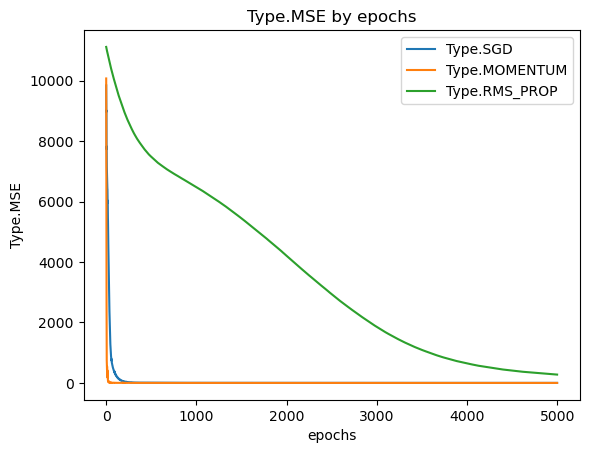

In [23]:
models = compare(
    p_layers=[1, 5, 1],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=sq_s_X_train,
    p_y=sq_s_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_methods=methods,
    p_beta=0.9
)

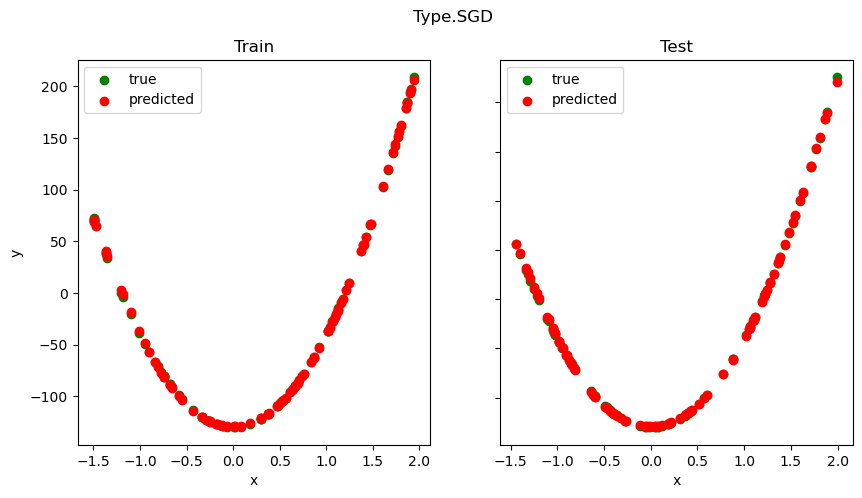

Type.SGD's metric (Type.MSE) on test: 1.165042142812967


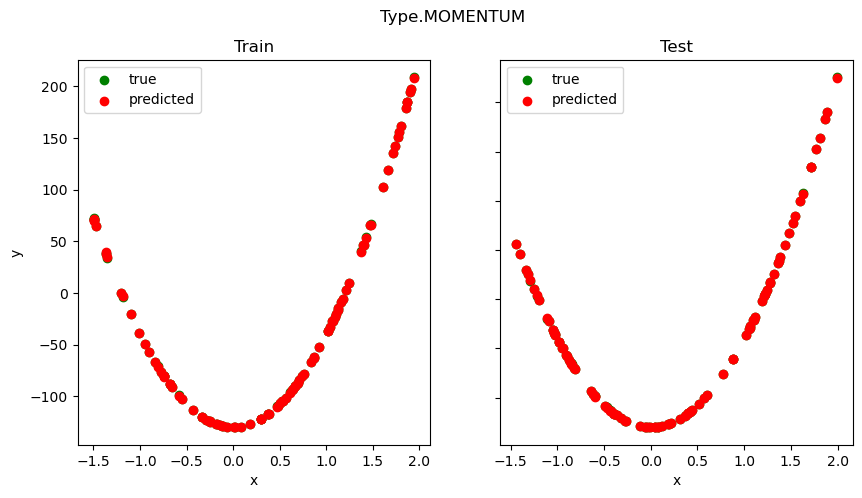

Type.MOMENTUM's metric (Type.MSE) on test: 0.043551066023511824


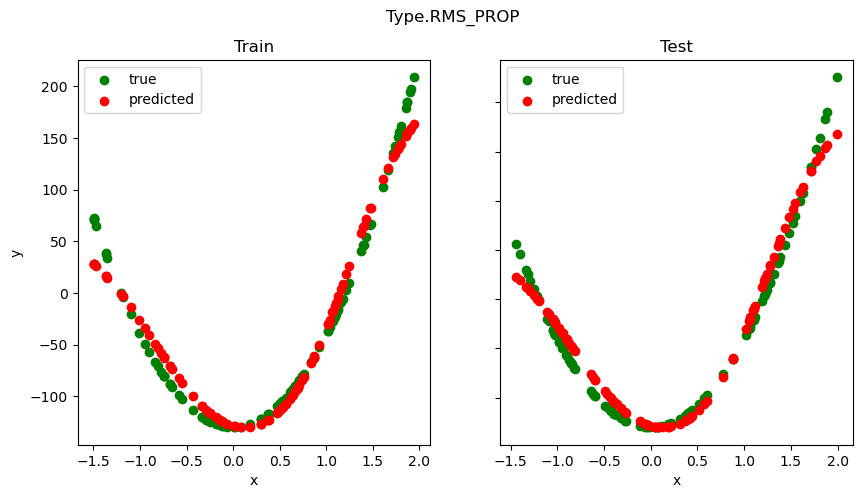

Type.RMS_PROP's metric (Type.MSE) on test: 201.0081950693633


In [24]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.MSE, sq_s_X_train, sq_s_y_train, sq_s_X_test, sq_s_y_test)

### 4.1.2. steps-small

In [25]:
st_s_X_train, st_s_y_train, st_s_X_test, st_s_y_test = read(
    filename_train='../data/regression/steps-small-training.csv',
    filename_test='../data/regression/steps-small-test.csv',
    header=True,
    rows=True,
    target='y'
)

In [26]:
# st_s_X_train[:10]
# st_s_y_train[:10]
# st_s_X_test[:10]
# st_s_y_test[:10]

Type.SGD evaluated in 0h 0m 3s
Type.SGD last metric: 70.40089992985534
Type.MOMENTUM evaluated in 0h 0m 3s
Type.MOMENTUM last metric: 0.27312030032964585
Type.RMS_PROP evaluated in 0h 0m 4s
Type.RMS_PROP last metric: 268.25096569726435


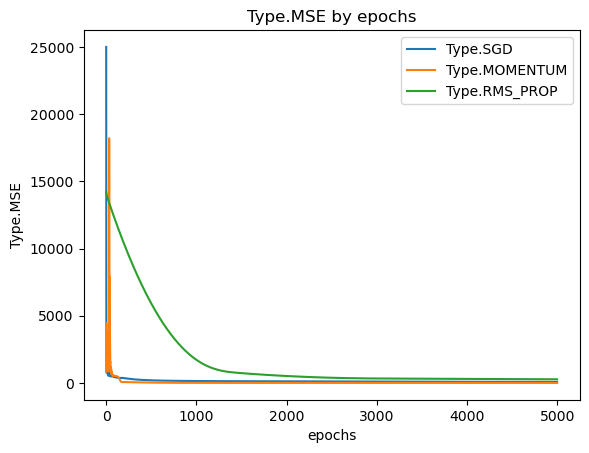

In [27]:
models = compare(
    p_layers=[1, 6, 10, 6, 1],
    p_act_t=Activation.Type.TANH,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=st_s_X_train,
    p_y=st_s_y_train,
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_methods=methods,
    p_beta=0.9
)

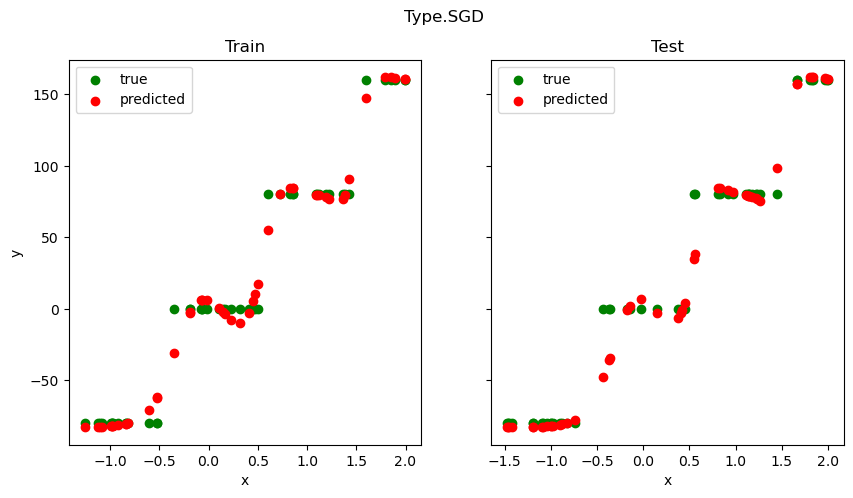

Type.SGD's metric (Type.MSE) on test: 185.05996239443596


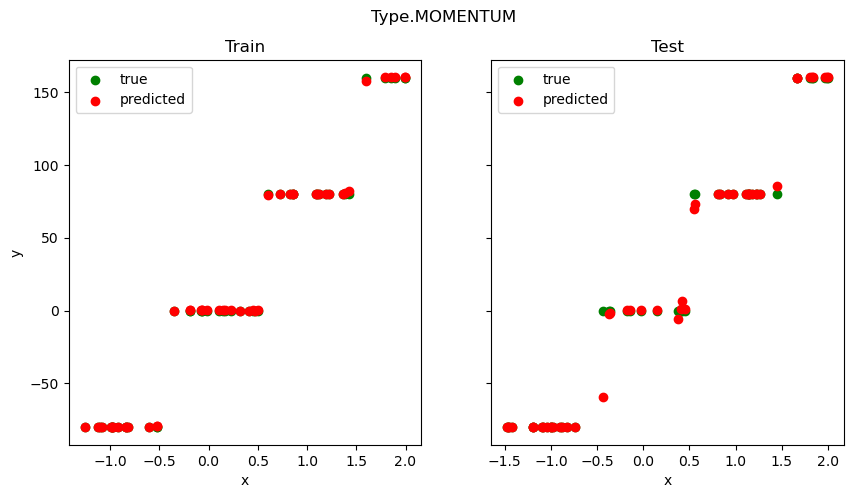

Type.MOMENTUM's metric (Type.MSE) on test: 75.40666969281658


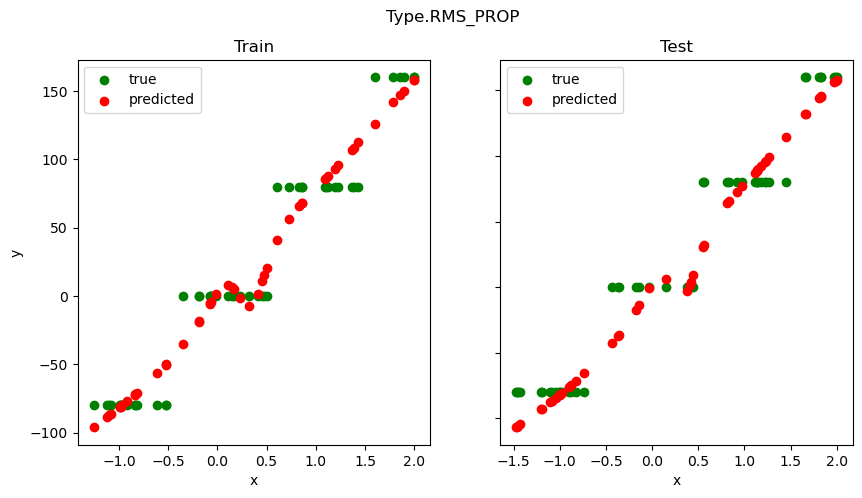

Type.RMS_PROP's metric (Type.MSE) on test: 372.213159174192


In [28]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.MSE, st_s_X_train, st_s_y_train, st_s_X_test, st_s_y_test)

### 4.1.3. square-large

In [29]:
sq_l_X_test, sq_l_y_test, sq_l_X_train, sq_l_y_train = read(
    filename_train='../data/regression/square-large-training.csv',
    filename_test='../data/regression/square-large-test.csv',
    header=True,
    rows=True,
    target='y'
)

In [30]:
# sq_l_X_train[:10]
# sq_l_y_train[:10]
# sq_l_X_test[:10]
# sq_l_y_test[:10]

Type.SGD evaluated in 0h 0m 15s
Type.SGD last metric: 0.5933661980573957
Type.MOMENTUM evaluated in 0h 0m 16s
Type.MOMENTUM last metric: 0.024374676507397663
Type.RMS_PROP evaluated in 0h 0m 20s
Type.RMS_PROP last metric: 1073.568449725851


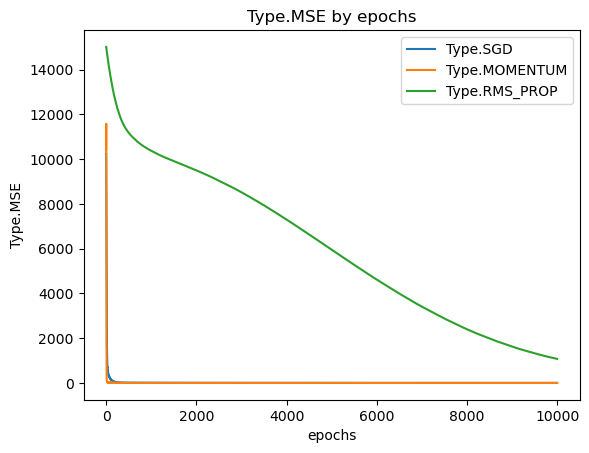

In [31]:
models = compare(
    p_layers=[1, 5, 1],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=sq_l_X_train,
    p_y=sq_l_y_train,
    p_epochs=10000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_methods=methods,
    p_beta=0.9
)

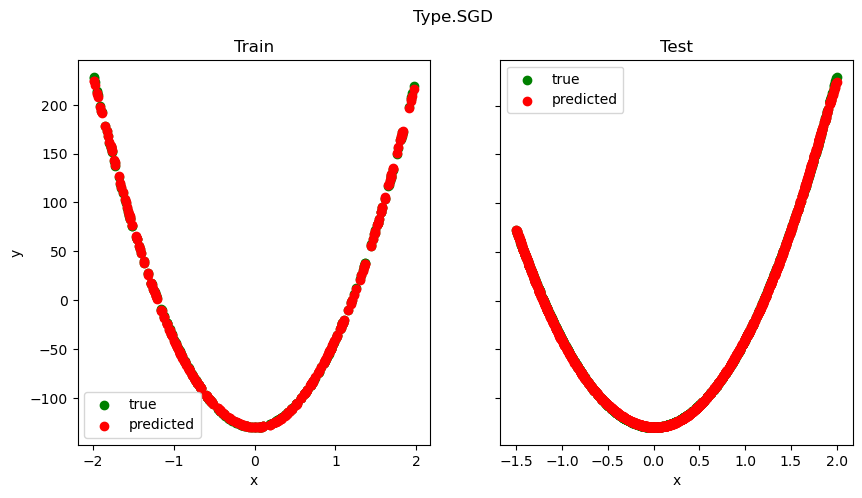

Type.SGD's metric (Type.MSE) on test: 0.5139098597822872


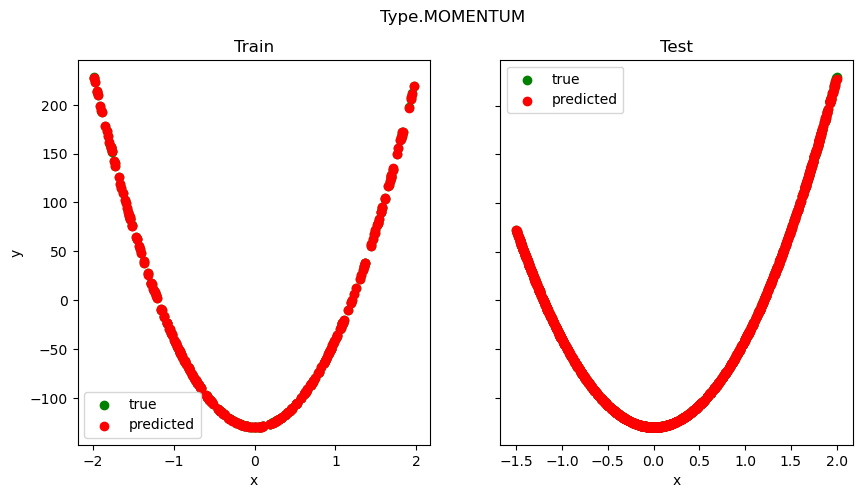

Type.MOMENTUM's metric (Type.MSE) on test: 0.028917385740288057


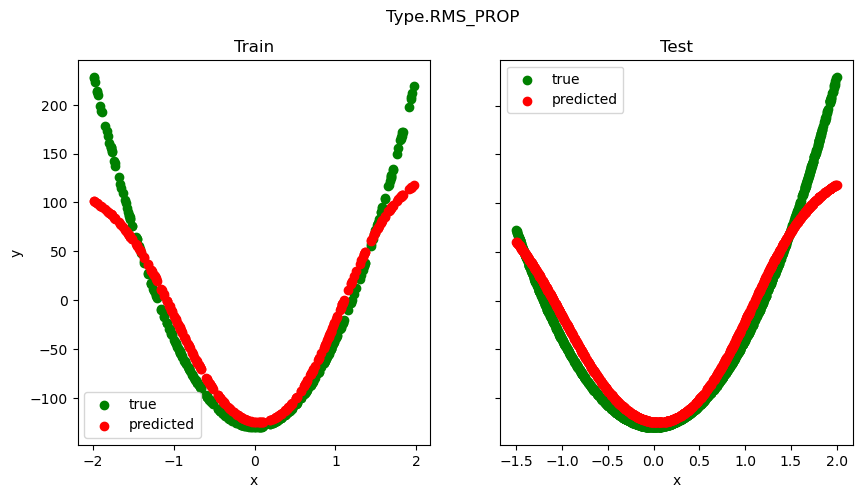

Type.RMS_PROP's metric (Type.MSE) on test: 615.7826582595508


In [32]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.MSE, sq_l_X_train, sq_l_y_train, sq_l_X_test, sq_l_y_test)

### 4.1.4. steps-large

In [33]:
st_l_X_train, st_l_y_train, st_l_X_test, st_l_y_test = read(
    filename_train='../data/regression/steps-large-training.csv',
    filename_test='../data/regression/steps-large-test.csv',
    header=True,
    rows=True,
    target='y'
)

In [34]:
# st_l_X_train[:10]
# st_l_y_train[:10]
# st_l_X_test[:10]
# st_l_y_test[:10]

Type.SGD evaluated in 0h 1m 53s
Type.SGD last metric: 344.1475443285423
Type.MOMENTUM evaluated in 0h 2m 12s
Type.MOMENTUM last metric: 31.67184211721142
Type.RMS_PROP evaluated in 0h 2m 20s
Type.RMS_PROP last metric: 4183.891694832649


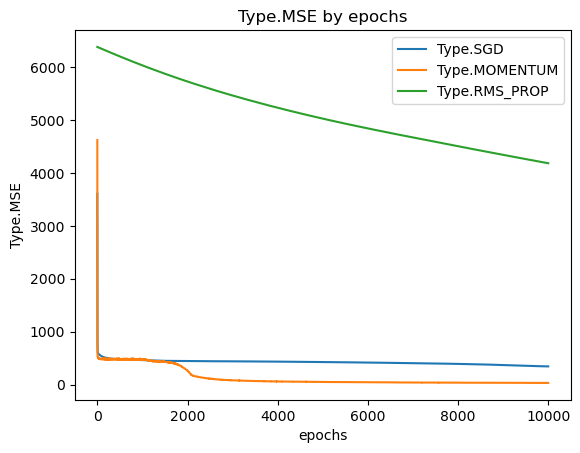

In [35]:
models = compare(
    p_layers=[1, 6, 6, 1],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=st_l_X_train,
    p_y=st_l_y_train,
    p_epochs=10000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_methods=methods,
    p_beta=0.9
)

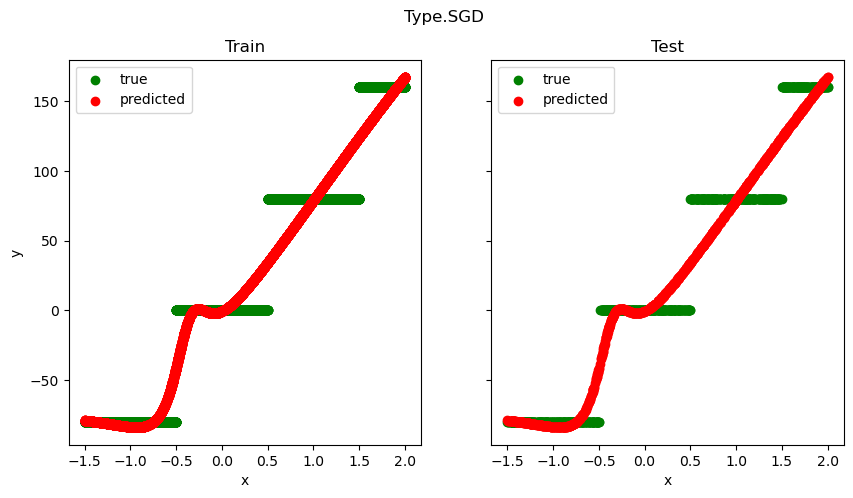

Type.SGD's metric (Type.MSE) on test: 340.44110988829493


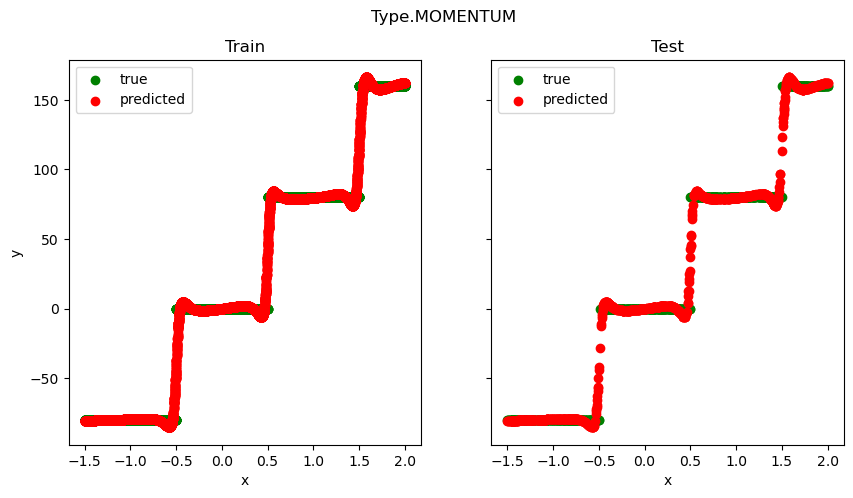

Type.MOMENTUM's metric (Type.MSE) on test: 28.65261935339027


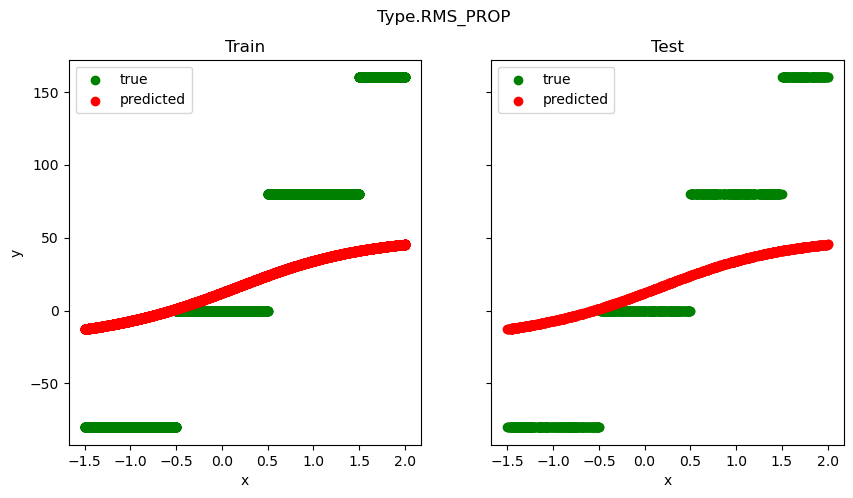

Type.RMS_PROP's metric (Type.MSE) on test: 4221.832968770674


In [36]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.MSE, st_l_X_train, st_l_y_train, st_l_X_test, st_l_y_test)

### 4.1.5. multimodal-large

In [37]:
mm_l_X_train, mm_l_y_train, mm_l_X_test, mm_l_y_test = read(
    filename_train='../data/regression/multimodal-large-training.csv',
    filename_test='../data/regression/multimodal-large-test.csv',
    header=True,
    rows=False,
    target='y'
)

In [38]:
# mm_l_X_train[:10]
# mm_l_y_train[:10]
# mm_l_X_test[:10]
# mm_l_y_test[:10]

Type.SGD evaluated in 0h 5m 5s
Type.SGD last metric: 5.828546202411459
Type.MOMENTUM evaluated in 0h 5m 31s
Type.MOMENTUM last metric: 7.406859764110323
Type.RMS_PROP evaluated in 0h 6m 23s
Type.RMS_PROP last metric: 204.26331414862136


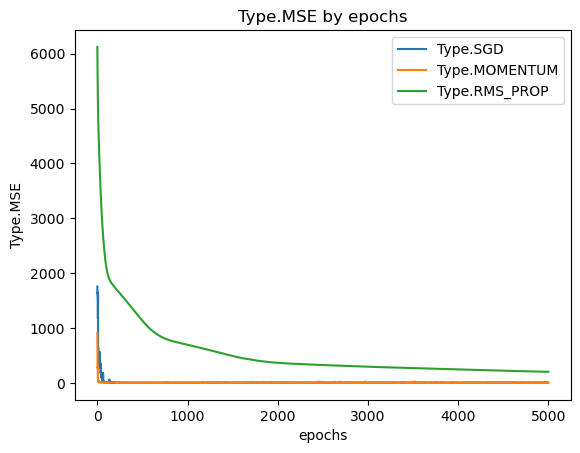

In [39]:
models = compare(
    p_layers=[1, 6, 10, 6, 1],
    p_act_t=Activation.Type.TANH,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=mm_l_X_train,
    p_y=mm_l_y_train,
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_methods=methods,
    p_beta=0.9
)

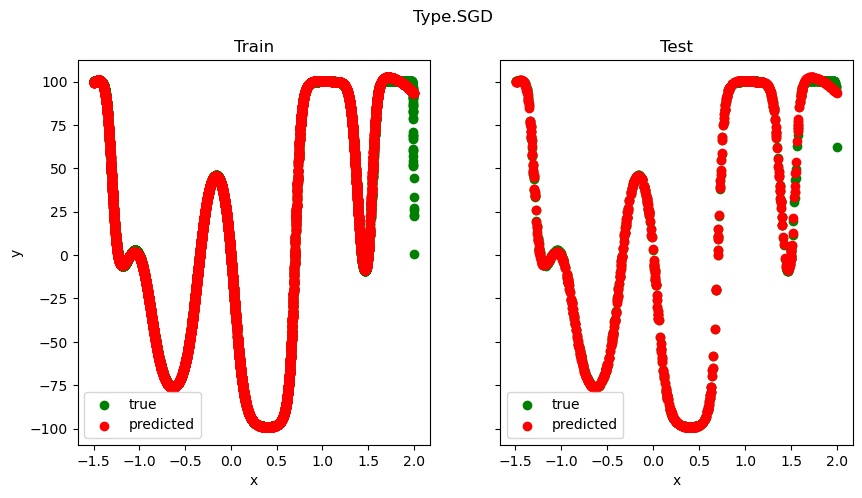

Type.SGD's metric (Type.MSE) on test: 1.8254375386680377


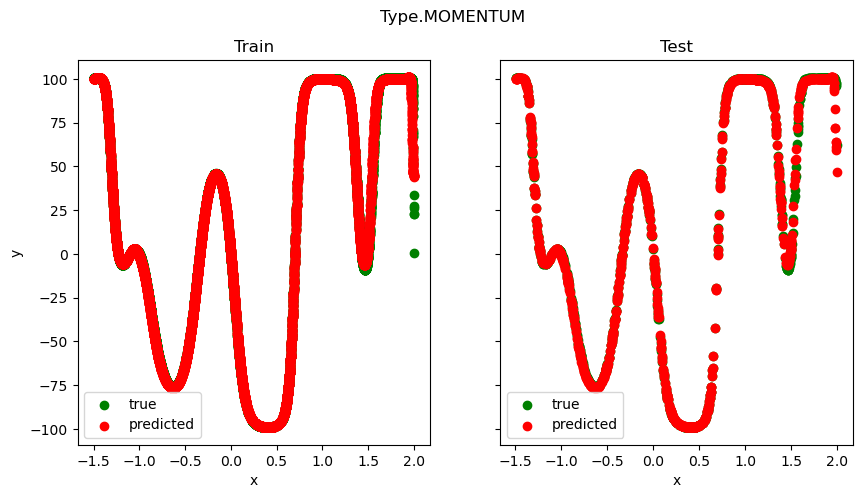

Type.MOMENTUM's metric (Type.MSE) on test: 8.942147455689277


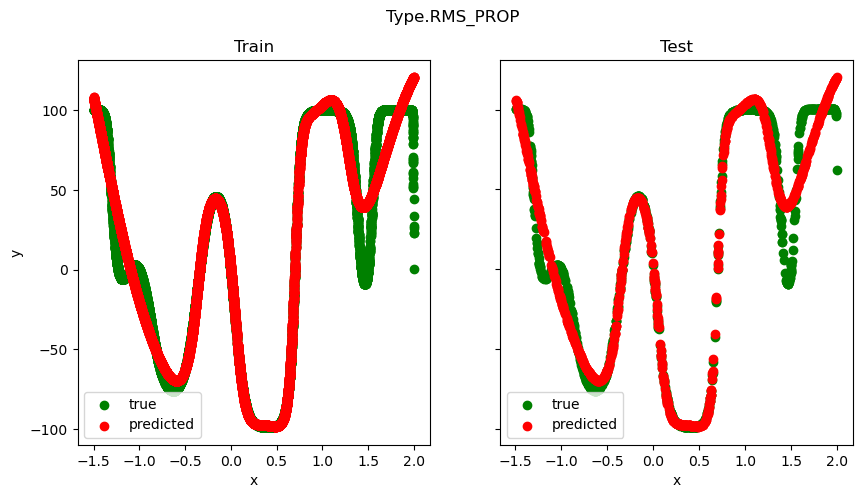

Type.RMS_PROP's metric (Type.MSE) on test: 205.20447810343117


In [40]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.MSE, mm_l_X_train, mm_l_y_train, mm_l_X_test, mm_l_y_test)

## 4.2. Classification

### 4.2.1. easy

In [41]:
easy_X_train, easy_y_train, easy_X_test, easy_y_test = read(
    filename_train='../data/classification/easy-training.csv',
    filename_test='../data/classification/easy-test.csv',
    header=True,
    rows=False,
    target='c'
)

In [42]:
# easy_X_train[:10]
# easy_y_train[:10]
# easy_X_test[:10]
# easy_y_test[:10]

In [43]:
len(np.unique(np.append(easy_y_train, easy_y_test)))

2

In [44]:
easy_y_train_enc = encode_one_hot(easy_y_train)
easy_y_test_enc = encode_one_hot(easy_y_test)

Type.SGD evaluated in 0h 0m 18s
Type.SGD last metric: [0.99601594 0.99598394]
Type.MOMENTUM evaluated in 0h 0m 19s
Type.MOMENTUM last metric: [1. 1.]
Type.RMS_PROP evaluated in 0h 0m 23s
Type.RMS_PROP last metric: [0.99601594 0.99598394]


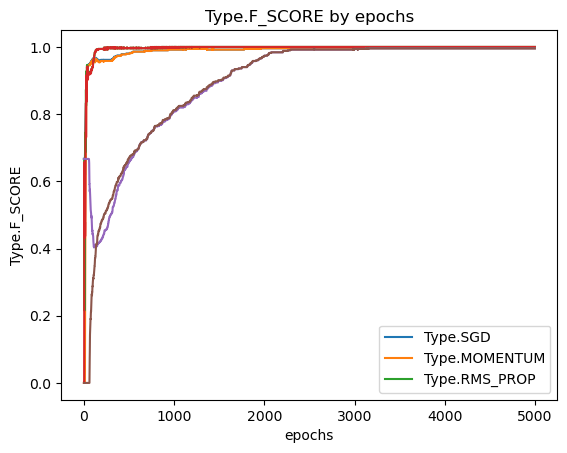

In [45]:
models = compare(
    p_layers=[2, 6, 10, 6, 2],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=easy_X_train,
    p_y=easy_y_train_enc,
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_methods=methods,
    p_beta=0.9
)

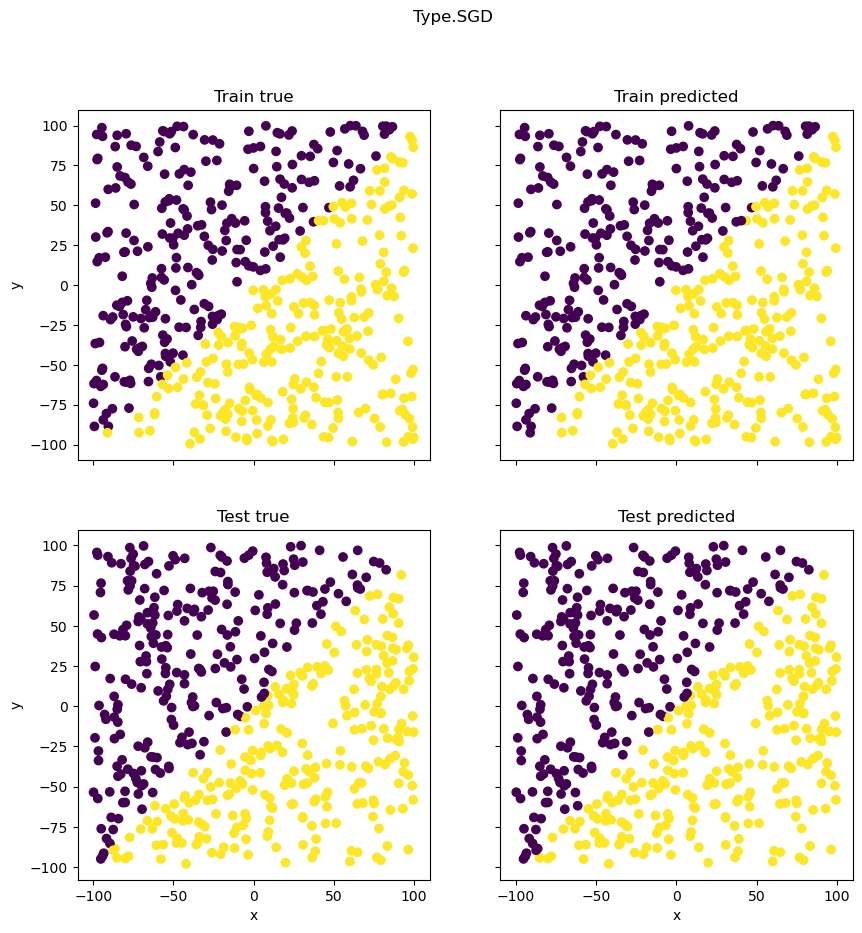

Type.SGD's metric (Type.F_SCORE) on test: [0.99398798 0.99401198]


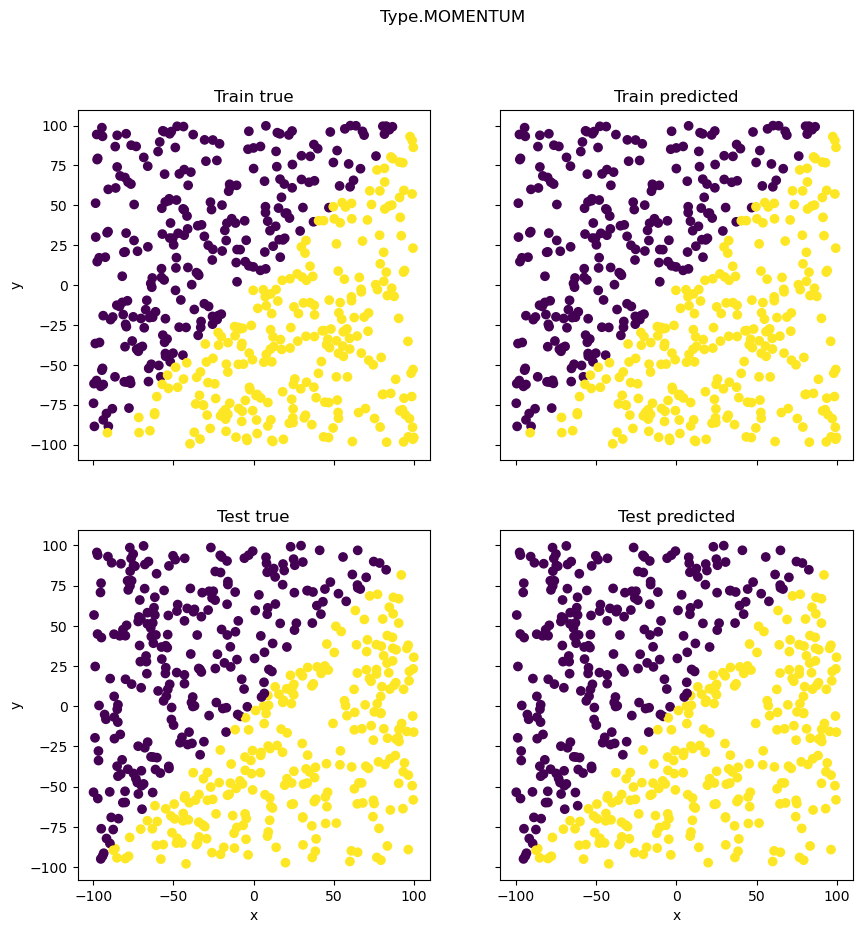

Type.MOMENTUM's metric (Type.F_SCORE) on test: [0.99798793 0.99801193]


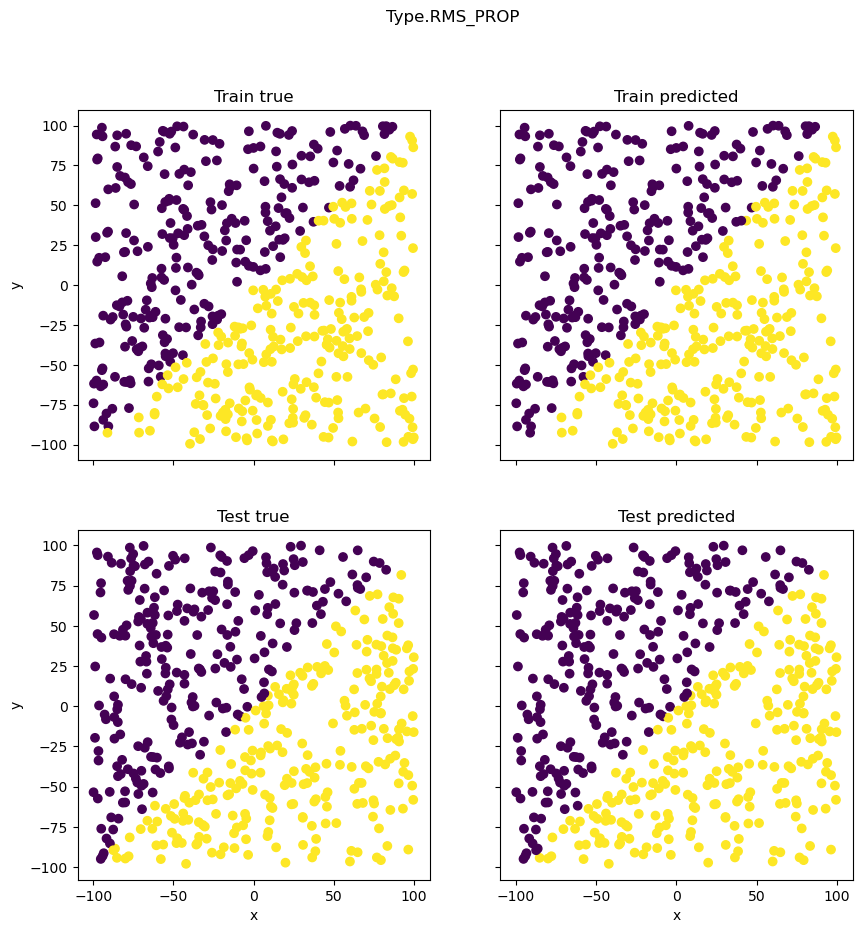

Type.RMS_PROP's metric (Type.F_SCORE) on test: [0.99398798 0.99401198]


In [46]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.F_SCORE, easy_X_train, easy_y_train, easy_X_test, easy_y_test)

### 4.2.2. rings3-regular

In [47]:
rings3_X_train, rings3_y_train, rings3_X_test, rings3_y_test = read(
    filename_train='../data/classification/rings3-regular-training.csv',
    filename_test='../data/classification/rings3-regular-test.csv',
    header=True,
    rows=False,
    target='c'
)

In [48]:
# rings3_X_train[:10]
# rings3_y_train[:10]
# rings3_X_test[:10]
# rings3_y_test[:10]

In [49]:
len(np.unique(np.append(rings3_y_train, rings3_y_test)))

3

In [50]:
rings3_y_train_enc = encode_one_hot(rings3_y_train)
rings3_y_test_enc = encode_one_hot(rings3_y_test)

Type.SGD evaluated in 0h 0m 51s
Type.SGD last metric: [0.5802969  0.68085106 0.80810029]
Type.MOMENTUM evaluated in 0h 0m 57s
Type.MOMENTUM last metric: [0.988      0.96579477 0.97614314]
Type.RMS_PROP evaluated in 0h 1m 5s
Type.RMS_PROP last metric: [0.83333333 0.71253534 0.62513426]


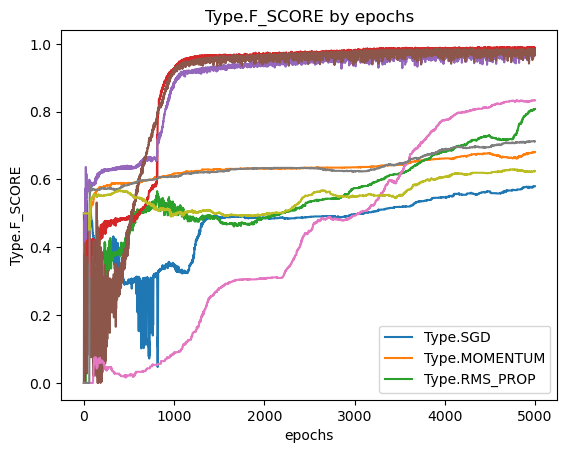

In [51]:
models = compare(
    p_layers=[2, 6, 10, 6, 3],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=rings3_X_train,
    p_y=rings3_y_train_enc,
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_methods=methods,
    p_beta=0.9
)

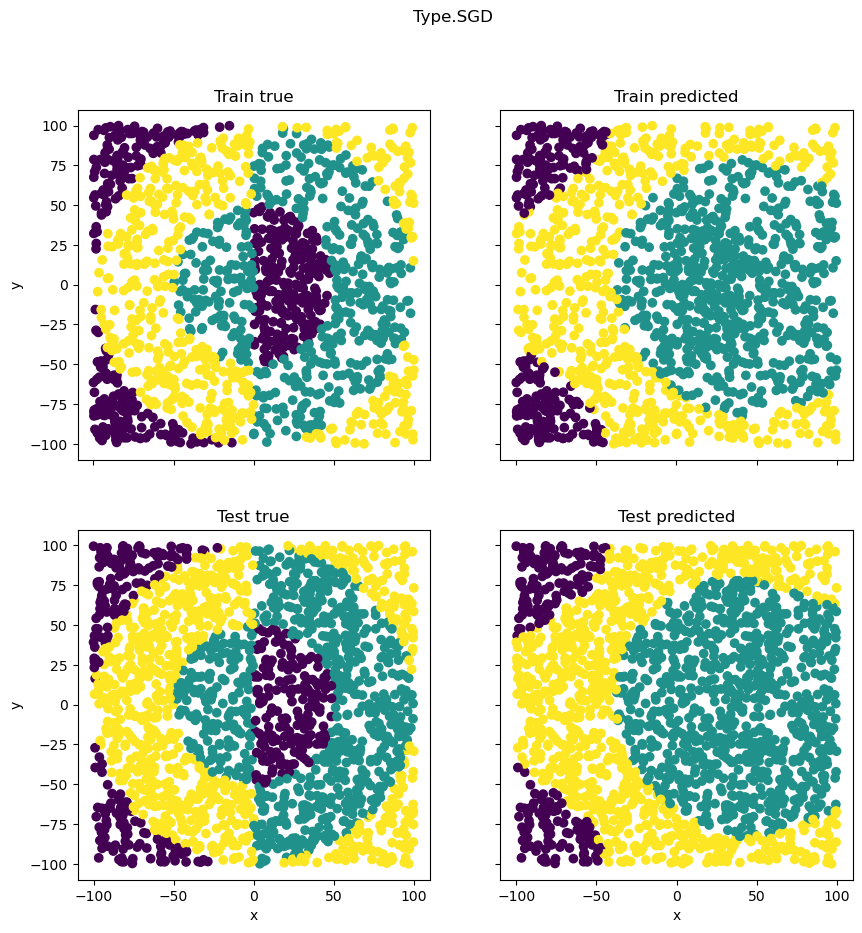

Type.SGD's metric (Type.F_SCORE) on test: [0.590625   0.75044669 0.82807852]


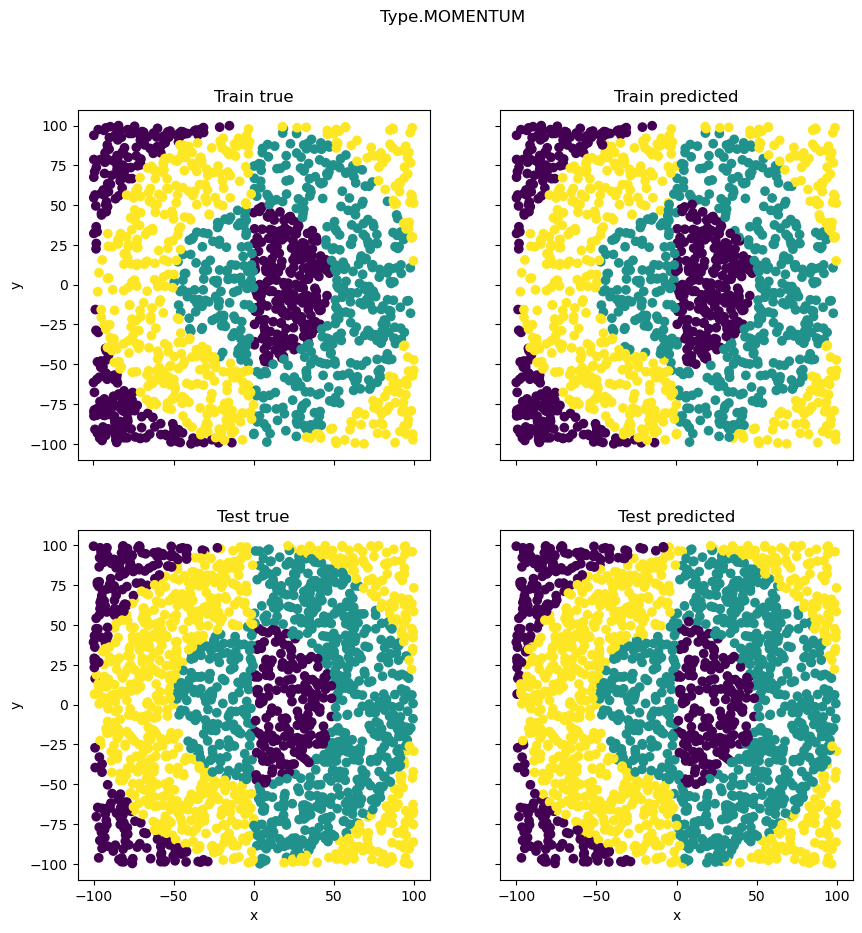

Type.MOMENTUM's metric (Type.F_SCORE) on test: [0.95990566 0.97409326 0.96641791]


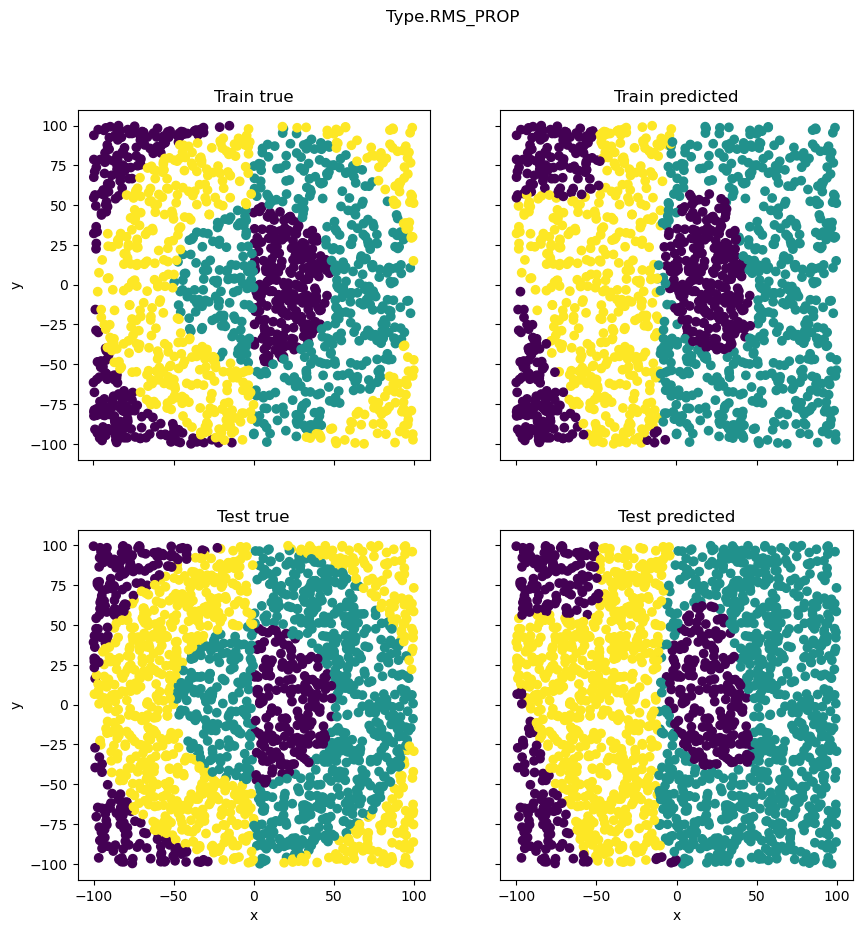

Type.RMS_PROP's metric (Type.F_SCORE) on test: [0.79391101 0.73345477 0.67778519]


In [52]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.F_SCORE, rings3_X_train, rings3_y_train, rings3_X_test, rings3_y_test)

### 4.2.3. rings5-regular

In [53]:
rings5_X_train, rings5_y_train, rings5_X_test, rings5_y_test = read(
    filename_train='../data/classification/rings5-regular-training.csv',
    filename_test='../data/classification/rings5-regular-test.csv',
    header=True,
    rows=False,
    target='c'
)

In [54]:
# rings5_X_train[:10]
# rings5_y_train[:10]
# rings5_X_test[:10]
# rings5_y_test[:10]

In [55]:
len(np.unique(np.append(rings5_y_train, rings5_y_test)))

5

In [56]:
rings5_y_train_enc = encode_one_hot(rings5_y_train)
rings5_y_test_enc = encode_one_hot(rings5_y_test)

Type.SGD evaluated in 0h 0m 53s
Type.SGD last metric: [0.         0.56549935 0.30107527 0.64761905 0.78694158]
Type.MOMENTUM evaluated in 0h 0m 52s
Type.MOMENTUM last metric: [0.97029703 0.94758065 0.93574297 0.94141414 0.96837945]
Type.RMS_PROP evaluated in 0h 0m 59s
Type.RMS_PROP last metric: [0.72365805 0.56551724 0.34       0.61988304 0.86111111]


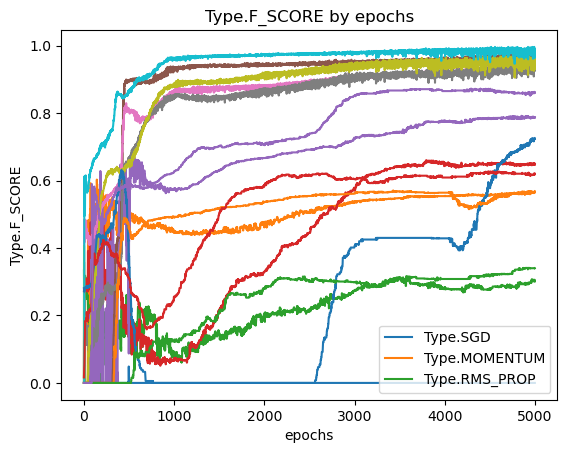

In [57]:
models = compare(
    p_layers=[2, 6, 10, 6, 5],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=rings5_X_train,
    p_y=rings5_y_train_enc,
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_methods=methods,
    p_beta=0.9
)

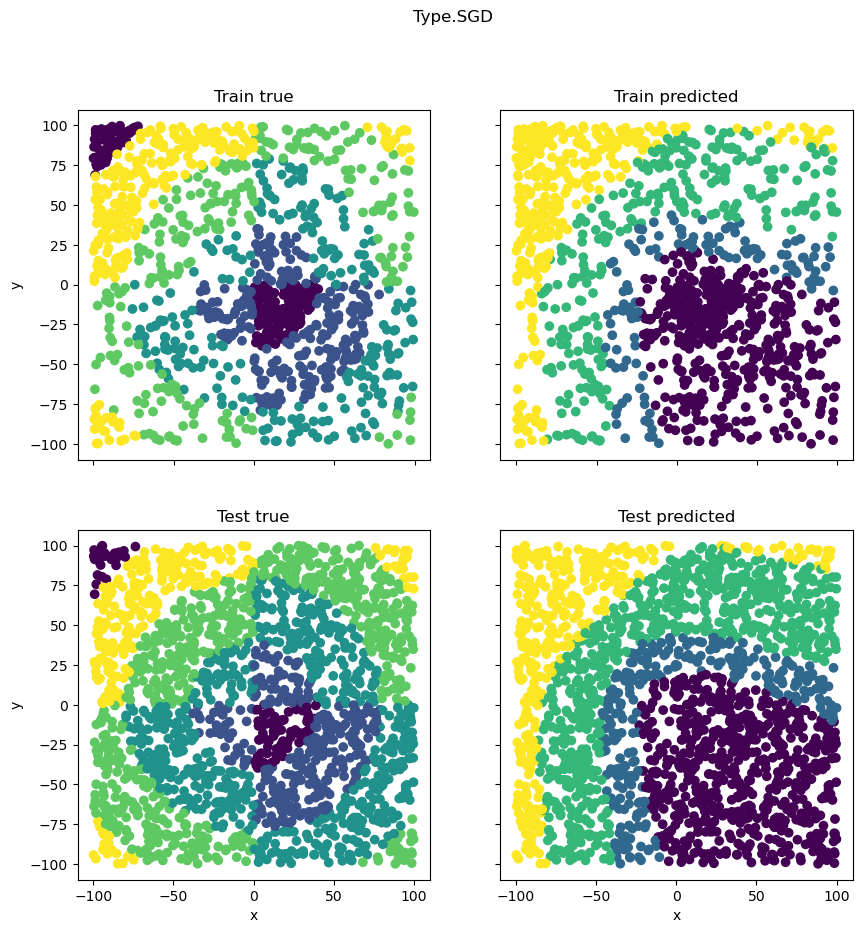

ValueError: operands could not be broadcast together with shapes (2000,5) (2000,4) 

In [58]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.F_SCORE, rings5_X_train, rings5_y_train, rings5_X_test, rings5_y_test)

### 4.2.4. xor3

In [59]:
xor3_X_train, xor3_y_train, xor3_X_test, xor3_y_test = read(
    filename_train='../data/classification/xor3-training.csv',
    filename_test='../data/classification/xor3-test.csv',
    header=True,
    rows=False,
    target='c'
)

In [60]:
# xor3_X_train[:10]
# xor3_y_train[:10]
# xor3_X_test[:10]
# xor3_y_test[:10]

In [61]:
len(np.unique(np.append(xor3_y_train, xor3_y_test)))

2

In [62]:
xor3_y_train_enc = encode_one_hot(xor3_y_train)
xor3_y_test_enc = encode_one_hot(xor3_y_test)

Type.SGD evaluated in 0h 0m 18s
Type.SGD last metric: [0.5        0.53846154]
Type.MOMENTUM evaluated in 0h 0m 18s
Type.MOMENTUM last metric: [0.97991968 0.98007968]
Type.RMS_PROP evaluated in 0h 0m 20s
Type.RMS_PROP last metric: [0.46741573 0.57297297]


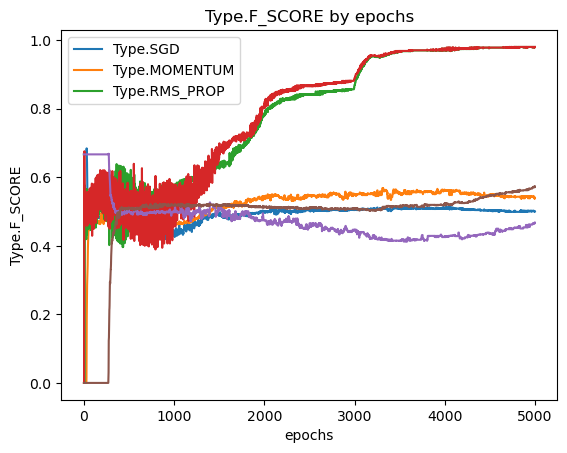

In [63]:
models = compare(
    p_layers=[2, 6, 10, 6, 2],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=xor3_X_train,
    p_y=xor3_y_train_enc,
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_methods=methods,
    p_beta=0.9
)

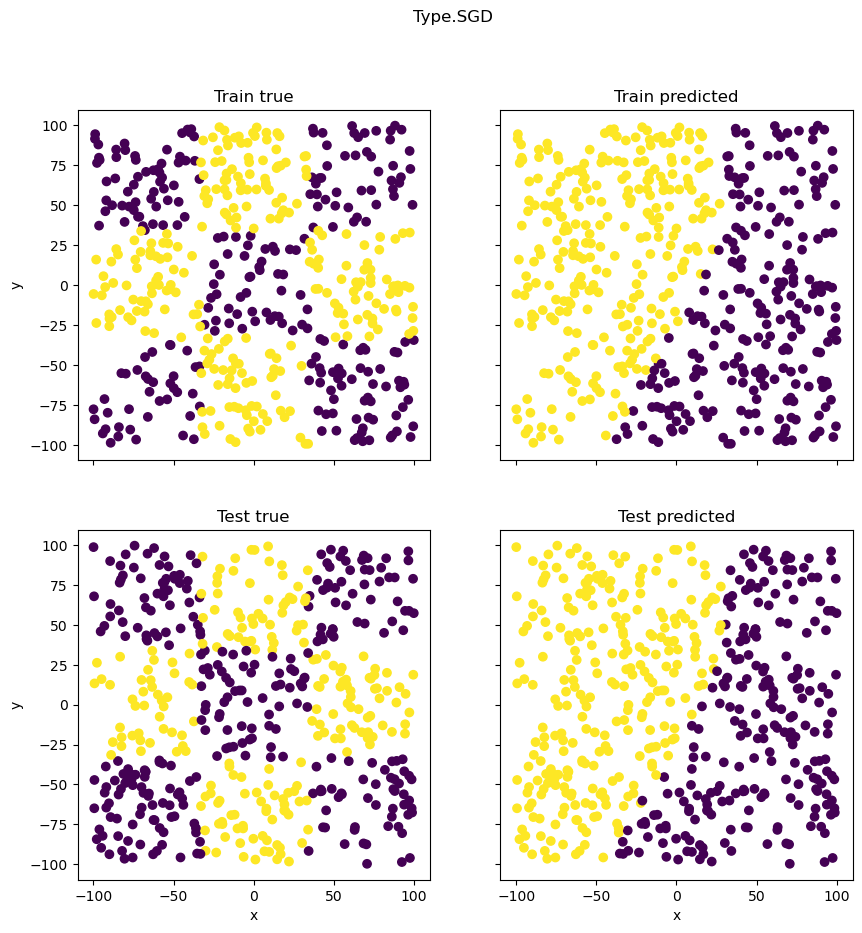

Type.SGD's metric (Type.F_SCORE) on test: [0.45801527 0.40336134]


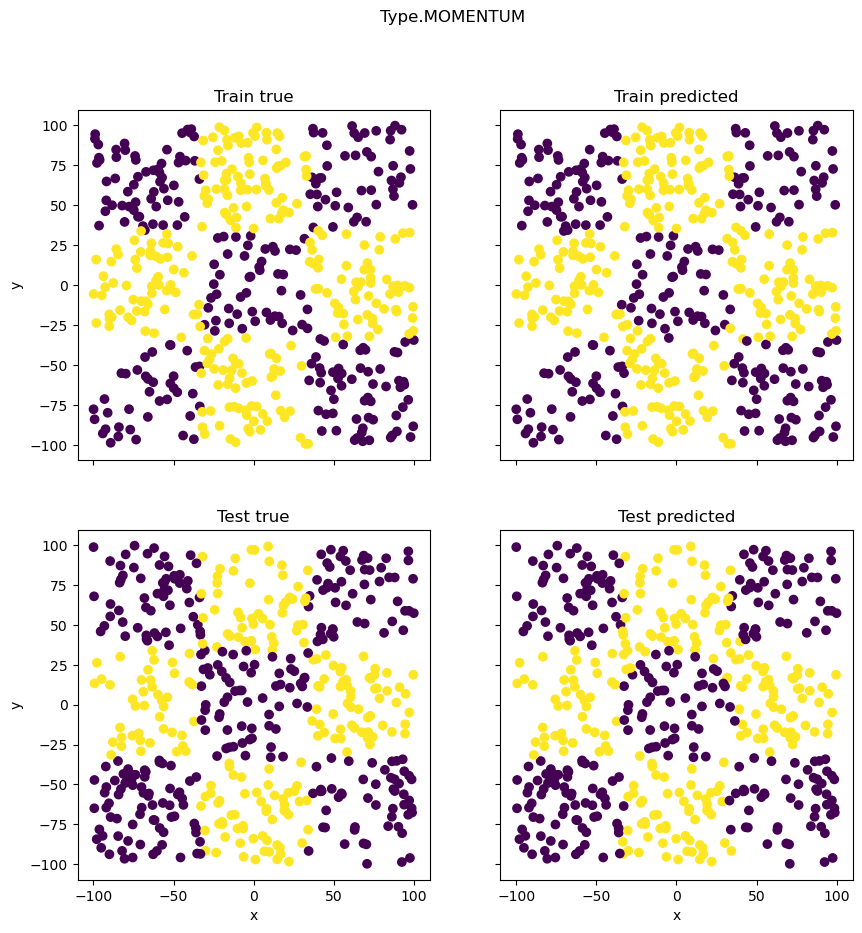

Type.MOMENTUM's metric (Type.F_SCORE) on test: [0.96527778 0.95283019]


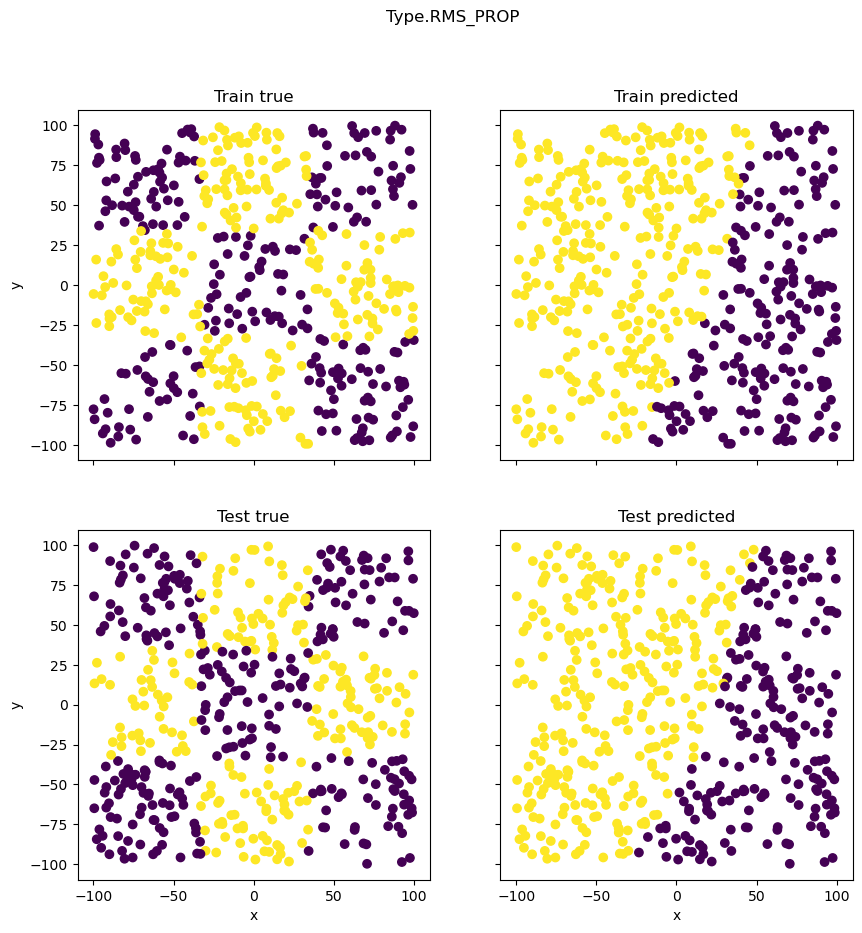

Type.RMS_PROP's metric (Type.F_SCORE) on test: [0.41869919 0.43700787]


In [64]:
for i in range(len(methods)):
    present(methods[i], models[i], Metric.Type.F_SCORE, xor3_X_train, xor3_y_train, xor3_X_test, xor3_y_test)

# 5. NN5

Testing different configurations

In [65]:
config_layers = [[1, 5, 1], [1, 5, 5, 1], [1, 5, 10, 5, 1]]

## 5.1. sigmoid

[1, 5, 1] evaluated in 0h 0m 21s
[1, 5, 1] last metric: 390.15776851646507
[1, 5, 5, 1] evaluated in 0h 0m 53s
[1, 5, 5, 1] last metric: 366.8190514663917
[1, 5, 10, 5, 1] evaluated in 0h 1m 49s
[1, 5, 10, 5, 1] last metric: 316.8283449855007


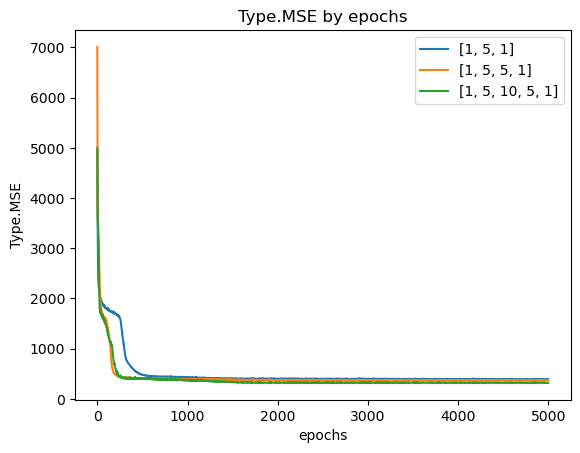

In [66]:
models = compare_layers(
    p_configs_layers=config_layers,
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=mm_l_X_train,
    p_y=mm_l_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

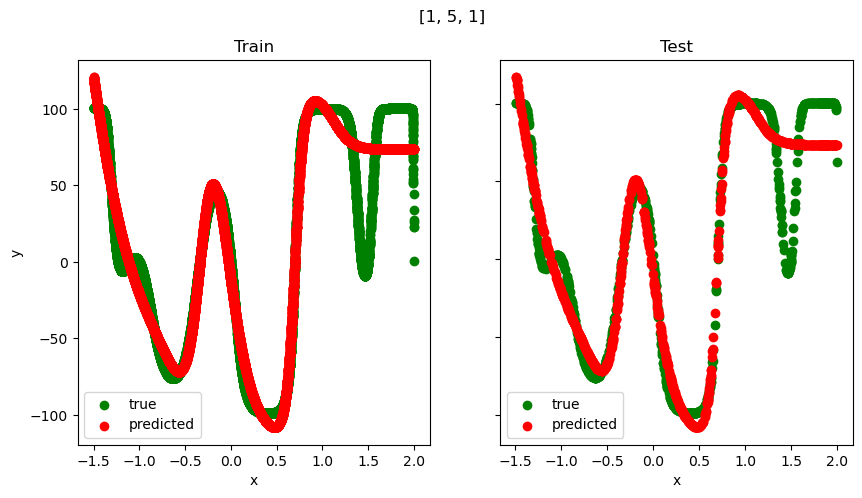

[1, 5, 1]'s metric (Type.MSE) on test: 422.69588522545934


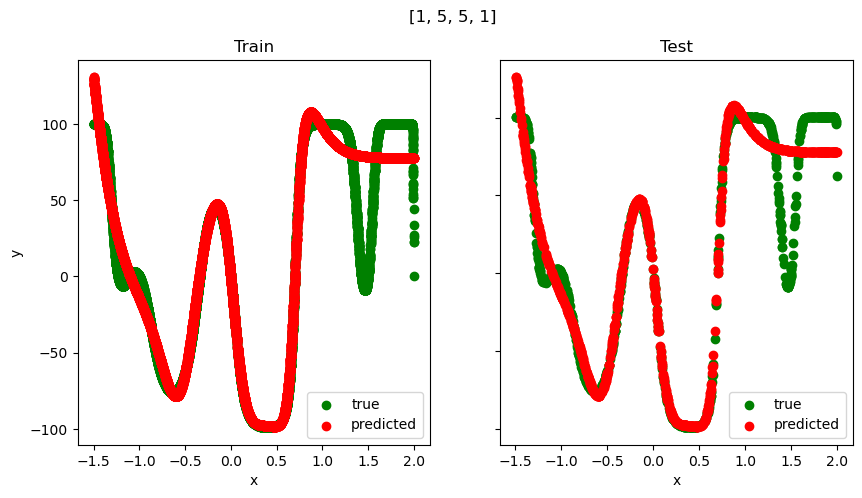

[1, 5, 5, 1]'s metric (Type.MSE) on test: 403.7716899264322


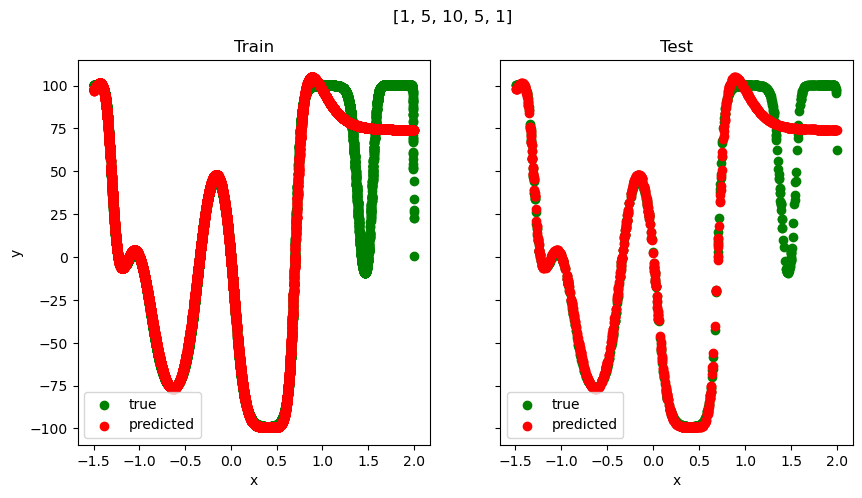

[1, 5, 10, 5, 1]'s metric (Type.MSE) on test: 352.7774392278604


In [67]:
for i in range(len(config_layers)):
    present(config_layers[i], models[i], Metric.Type.MSE, mm_l_X_train, mm_l_y_train, mm_l_X_test, mm_l_y_test)

## 5.2. linear

[1, 5, 1] evaluated in 0h 0m 14s
[1, 5, 1] last metric: 4398.2584045510785


C:\Users\Hendrick\AppData\Local\Temp\ipykernel_9196\2746877032.py:35: RuntimeWarning: overflow encountered in matmul
  self.z = self.x @ self.weights + self.biases
C:\Users\Hendrick\AppData\Local\Temp\ipykernel_9196\2746877032.py:35: RuntimeWarning: invalid value encountered in matmul
  self.z = self.x @ self.weights + self.biases


[1, 5, 5, 1] evaluated in 0h 0m 28s
[1, 5, 5, 1] last metric: nan


C:\Users\Hendrick\AppData\Local\Temp\ipykernel_9196\2154991806.py:159: RuntimeWarning: overflow encountered in matmul
  self.layers[l].weights_grad = self.layers[l].x.T @ delta
C:\Users\Hendrick\AppData\Local\Temp\ipykernel_9196\2154991806.py:161: RuntimeWarning: overflow encountered in matmul
  delta = (delta @ self.layers[l].weights.T) * self.layers[l - 1].act.der(self.layers[l - 1].z)
C:\Users\Hendrick\AppData\Local\Temp\ipykernel_9196\2154991806.py:161: RuntimeWarning: invalid value encountered in matmul
  delta = (delta @ self.layers[l].weights.T) * self.layers[l - 1].act.der(self.layers[l - 1].z)


[1, 5, 10, 5, 1] evaluated in 0h 0m 50s
[1, 5, 10, 5, 1] last metric: nan


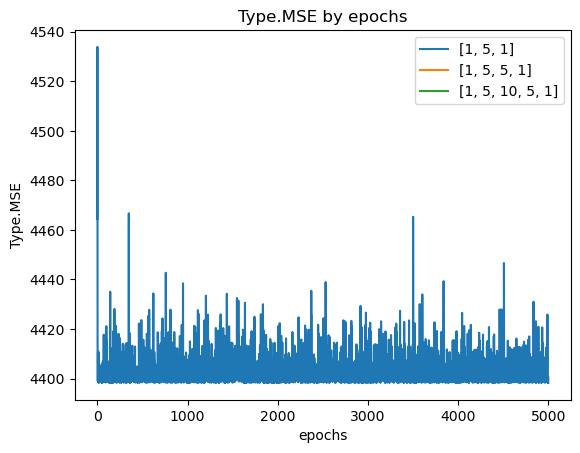

In [68]:
models = compare_layers(
    p_configs_layers=config_layers,
    p_act_t=Activation.Type.LINEAR,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=mm_l_X_train,
    p_y=mm_l_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

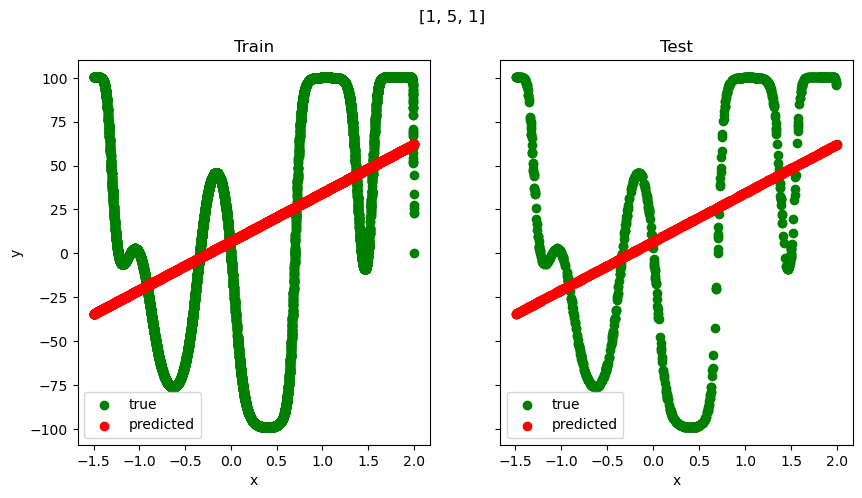

[1, 5, 1]'s metric (Type.MSE) on test: 4433.880893773602


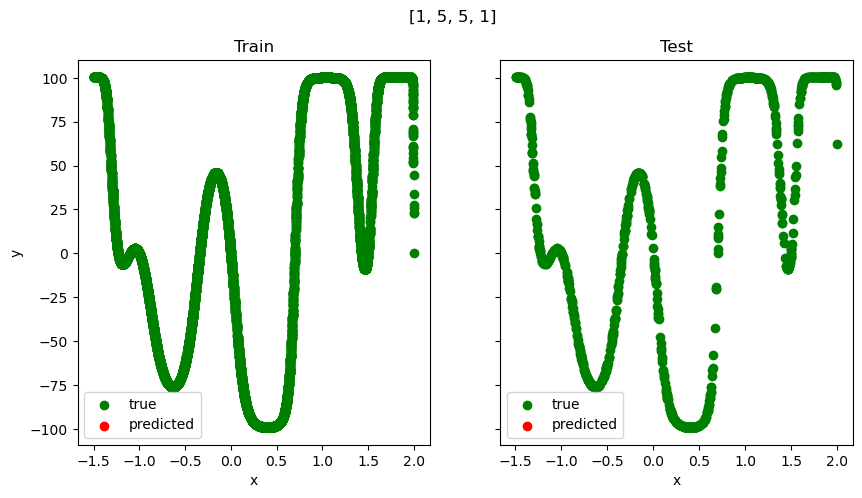

[1, 5, 5, 1]'s metric (Type.MSE) on test: nan


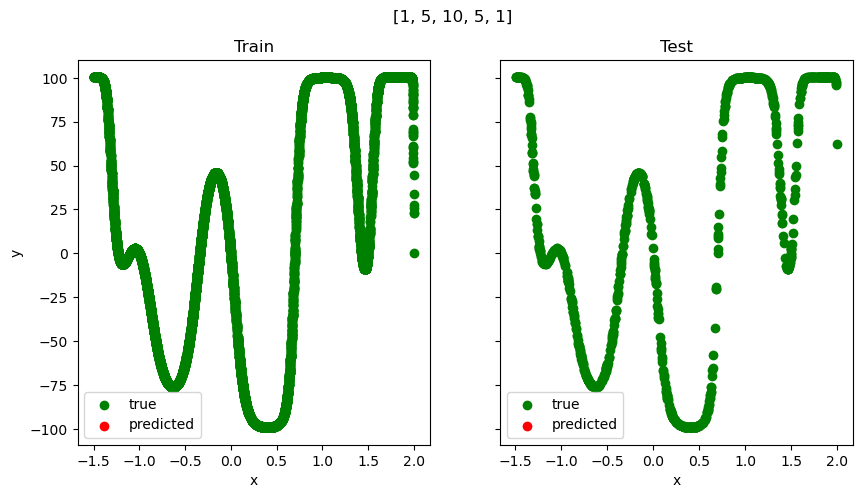

[1, 5, 10, 5, 1]'s metric (Type.MSE) on test: nan


In [69]:
for i in range(len(config_layers)):
    present(config_layers[i], models[i], Metric.Type.MSE, mm_l_X_train, mm_l_y_train, mm_l_X_test, mm_l_y_test)

## 5.3. tanh

[1, 5, 1] evaluated in 0h 0m 32s
[1, 5, 1] last metric: 233.77363837928638
[1, 5, 5, 1] evaluated in 0h 1m 18s
[1, 5, 5, 1] last metric: 23.486832875092635
[1, 5, 10, 5, 1] evaluated in 0h 2m 43s
[1, 5, 10, 5, 1] last metric: 288.93961828043547


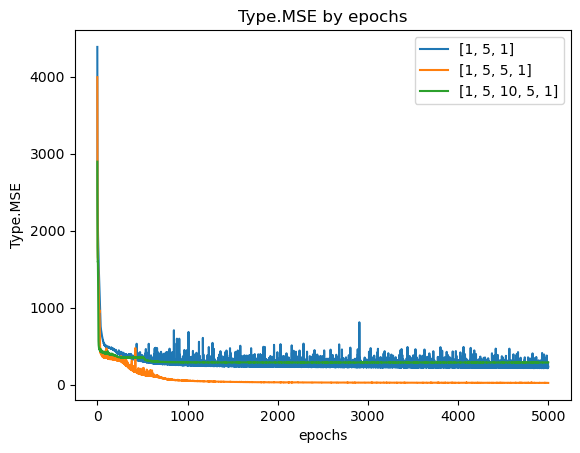

In [70]:
models = compare_layers(
    p_configs_layers=config_layers,
    p_act_t=Activation.Type.TANH,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=mm_l_X_train,
    p_y=mm_l_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

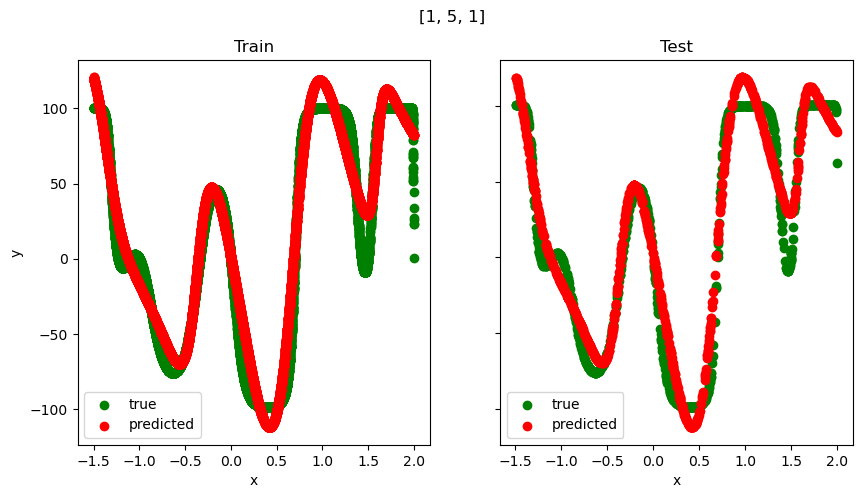

[1, 5, 1]'s metric (Type.MSE) on test: 234.67004356118645


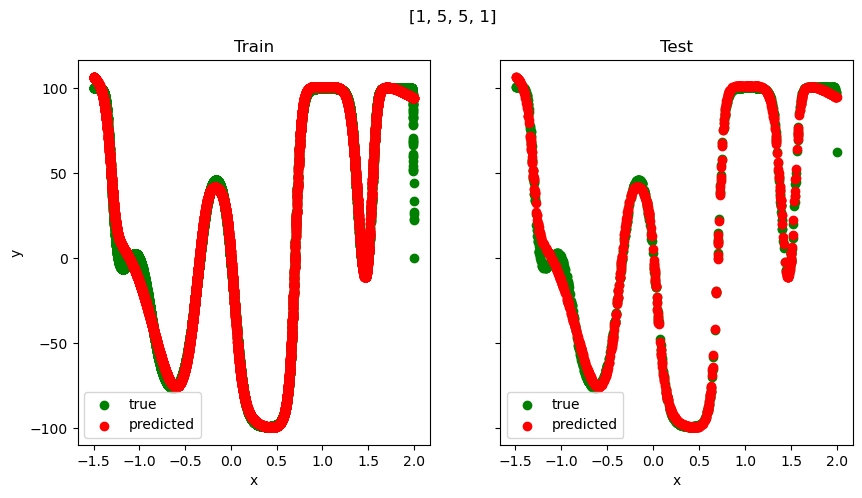

[1, 5, 5, 1]'s metric (Type.MSE) on test: 18.156522214383944


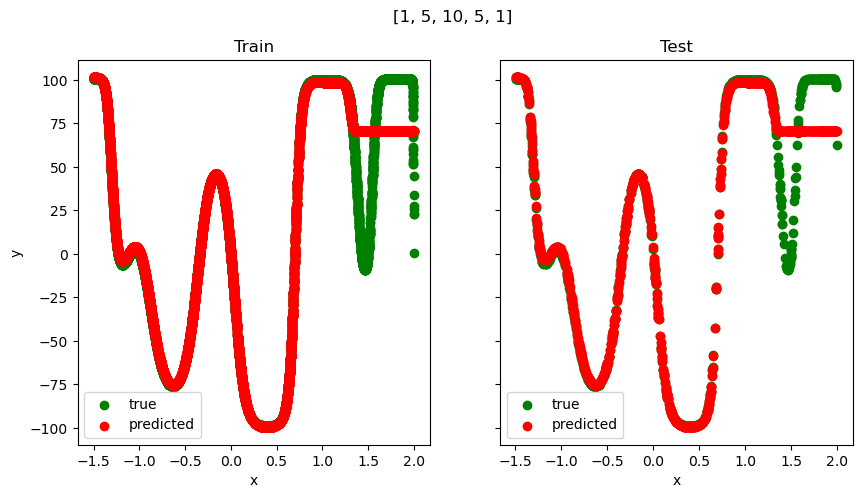

[1, 5, 10, 5, 1]'s metric (Type.MSE) on test: 320.58417426714453


In [71]:
for i in range(len(config_layers)):
    present(config_layers[i], models[i], Metric.Type.MSE, mm_l_X_train, mm_l_y_train, mm_l_X_test, mm_l_y_test)

## 5.4. ReLU

[1, 5, 1] evaluated in 0h 0m 17s
[1, 5, 1] last metric: 2834.1075617979704
[1, 5, 5, 1] evaluated in 0h 0m 39s
[1, 5, 5, 1] last metric: 1607.7921587398066
[1, 5, 10, 5, 1] evaluated in 0h 1m 0s
[1, 5, 10, 5, 1] last metric: 5189.074249739405


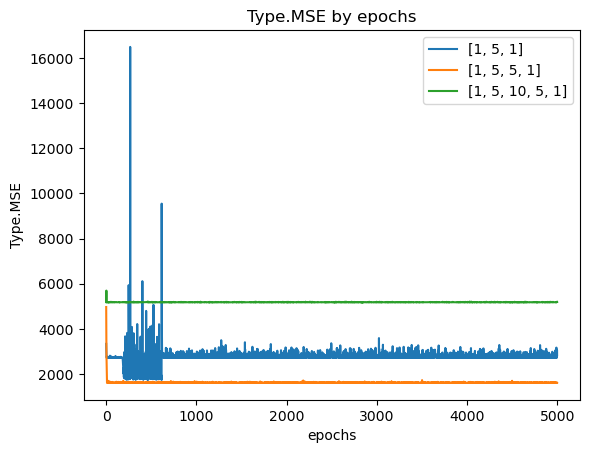

In [72]:
models = compare_layers(
    p_configs_layers=config_layers,
    p_act_t=Activation.Type.RE_LU,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=mm_l_X_train,
    p_y=mm_l_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

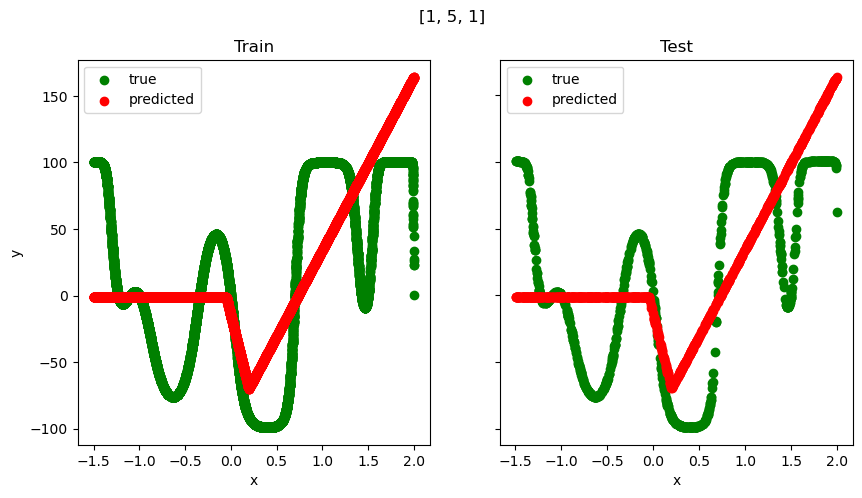

[1, 5, 1]'s metric (Type.MSE) on test: 2925.67063348681


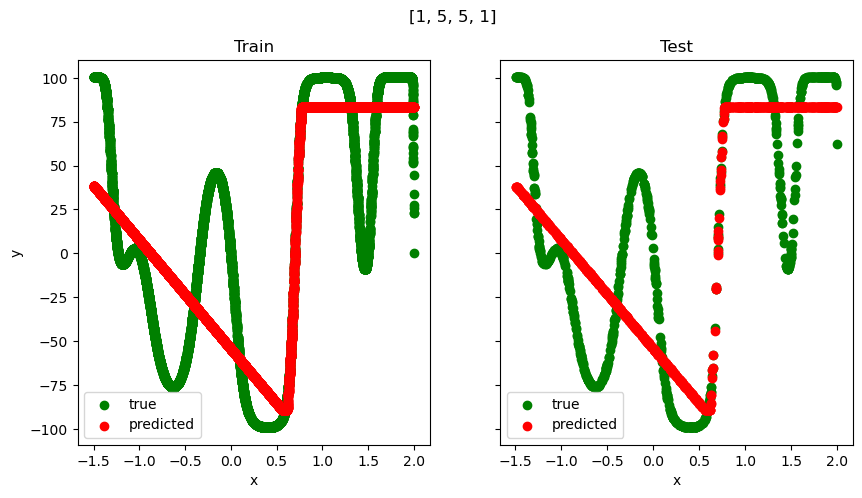

[1, 5, 5, 1]'s metric (Type.MSE) on test: 1675.8529548230101


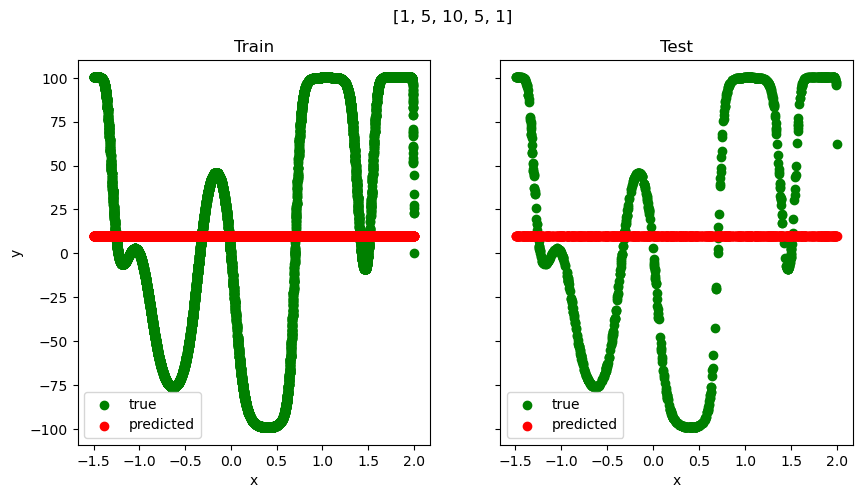

[1, 5, 10, 5, 1]'s metric (Type.MSE) on test: 5235.043030998387


In [73]:
for i in range(len(config_layers)):
    present(config_layers[i], models[i], Metric.Type.MSE, mm_l_X_train, mm_l_y_train, mm_l_X_test, mm_l_y_test)

# 6. Evaluating seemingly best architectures

The best models are seem to be tanh [1, 5, 5, 1] and sigmoid [1, 5, 10, 5, 1]

## 6.1. steps-large

### 6.1.1. tanh [1, 5, 5, 1]

[1, 5, 5, 1] evaluated in 0h 1m 33s
[1, 5, 5, 1] last metric: 13.221866857553957


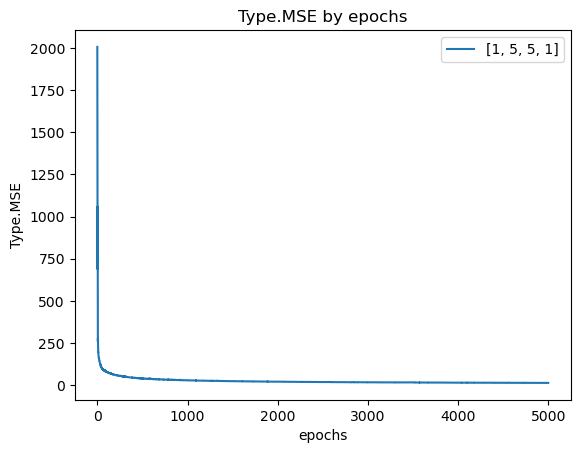

In [74]:
models = compare_layers(
    p_configs_layers=[[1, 5, 5, 1]],
    p_act_t=Activation.Type.TANH,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=st_l_X_train,
    p_y=st_l_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

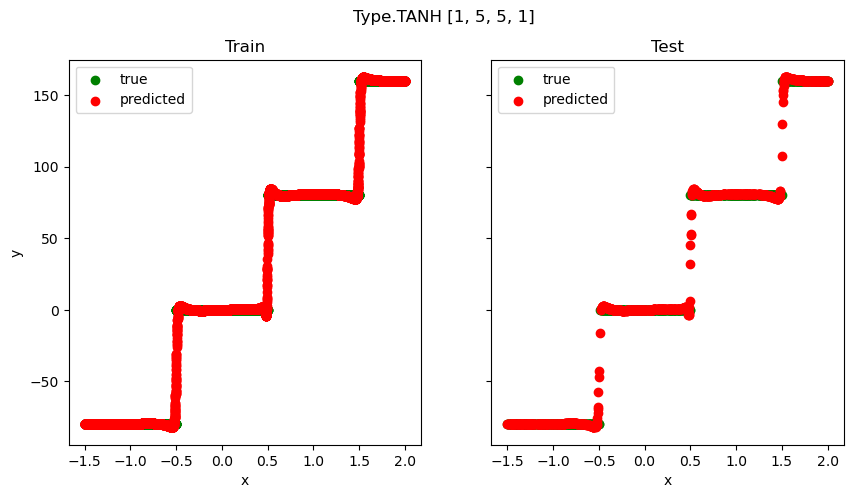

Type.TANH [1, 5, 5, 1]'s metric (Type.MSE) on test: 10.643582634653665


In [75]:
present(f'{Activation.Type.TANH} [1, 5, 5, 1]', models[0], Metric.Type.MSE, st_l_X_train, st_l_y_train, st_l_X_test, st_l_y_test)

### 6.1.2. sigmoid [1, 5, 10, 5, 1]

[1, 5, 10, 5, 1] evaluated in 0h 1m 50s
[1, 5, 10, 5, 1] last metric: 21.03488770296965


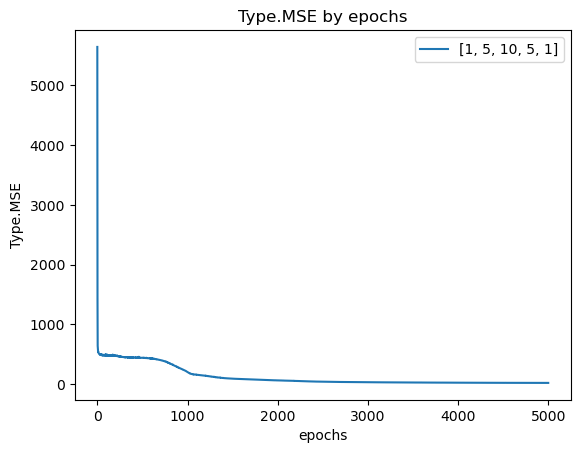

In [76]:
models = compare_layers(
    p_configs_layers=[[1, 5, 10, 5, 1]],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.LINEAR,
    p_weights_t=Weights.Type.HE,
    p_x=st_l_X_train,
    p_y=st_l_y_train,
    p_epochs=5000,
    p_mb_size=0.1,
    p_lr=0.001,
    p_shuffle=True,
    p_normal=True,
    p_cost_t=Cost.Type.MSE,
    p_metric_t=Metric.Type.MSE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

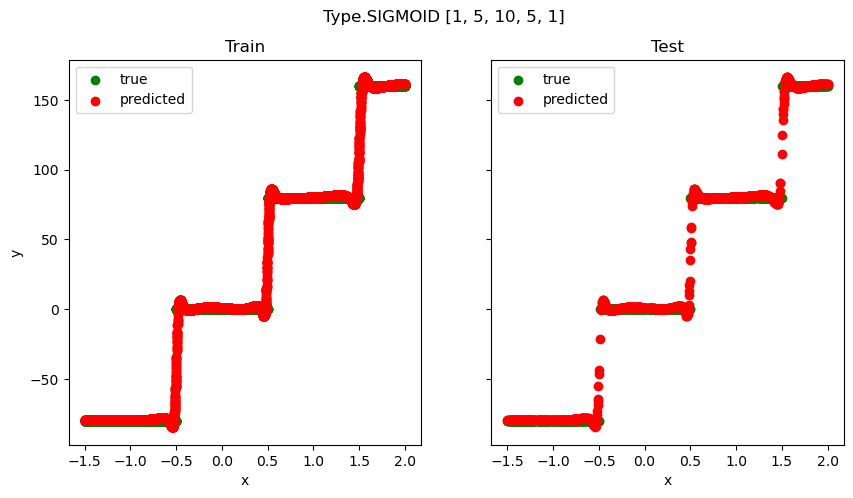

Type.SIGMOID [1, 5, 10, 5, 1]'s metric (Type.MSE) on test: 17.826342269551095


In [77]:
present(f'{Activation.Type.SIGMOID} [1, 5, 10, 5, 1]', models[0], Metric.Type.MSE, st_l_X_train, st_l_y_train, st_l_X_test, st_l_y_test)

## 6.2. rings5-regular

### 6.2.1. tanh [2, 5, 5, 5]

[2, 5, 5, 5] evaluated in 0h 0m 36s
[2, 5, 5, 5] last metric: [0.94653465 0.90322581 0.8788501  0.88095238 0.9488189 ]


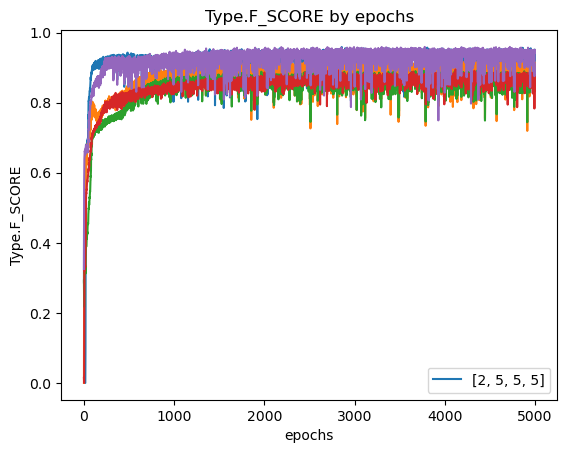

In [78]:
models = compare_layers(
    p_configs_layers=[[2, 5, 5, 5]],
    p_act_t=Activation.Type.TANH,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=rings5_X_train,
    p_y=encode_one_hot(rings5_y_train),
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

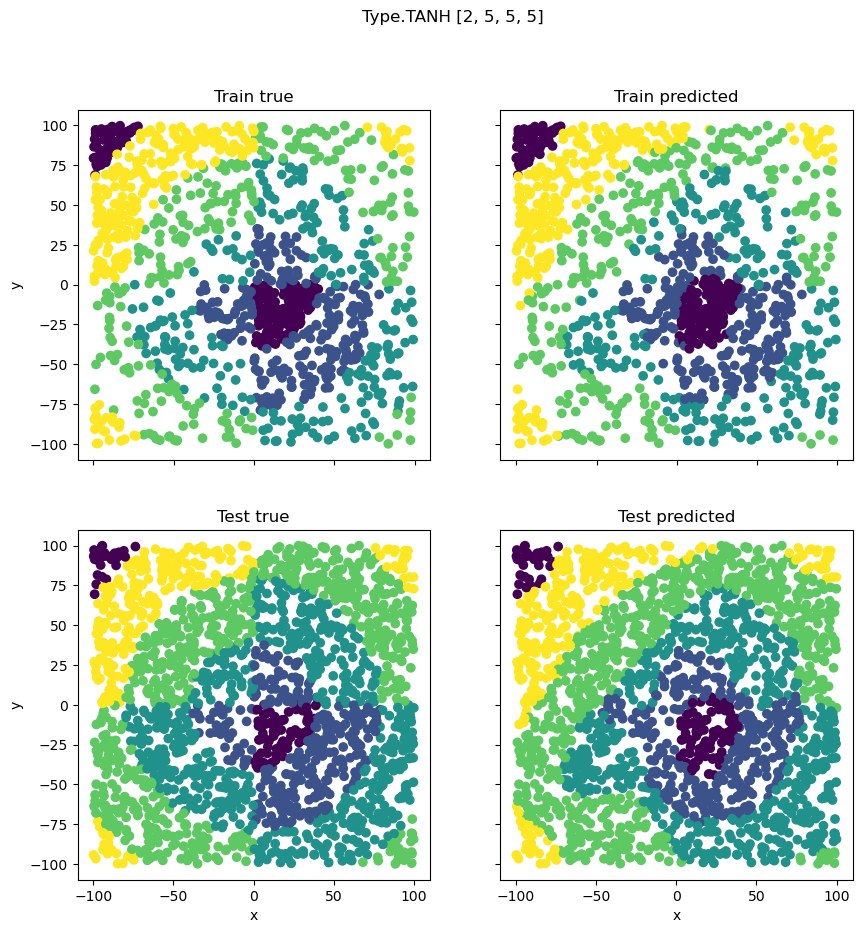

Type.TANH [2, 5, 5, 5]'s metric (Type.F_SCORE) on test: [0.83333333 0.8427673  0.83940397 0.86455331 0.875     ]


In [79]:
present(f'{Activation.Type.TANH} [2, 5, 5, 5]', models[0], Metric.Type.F_SCORE, rings5_X_train, rings5_y_train, rings5_X_test, rings5_y_test)

### 6.2.2. sigmoid [2, 5, 10, 5, 5]

[2, 5, 10, 5, 5] evaluated in 0h 0m 50s
[2, 5, 10, 5, 5] last metric: [0.94422311 0.88888889 0.86070686 0.8968254  0.96      ]


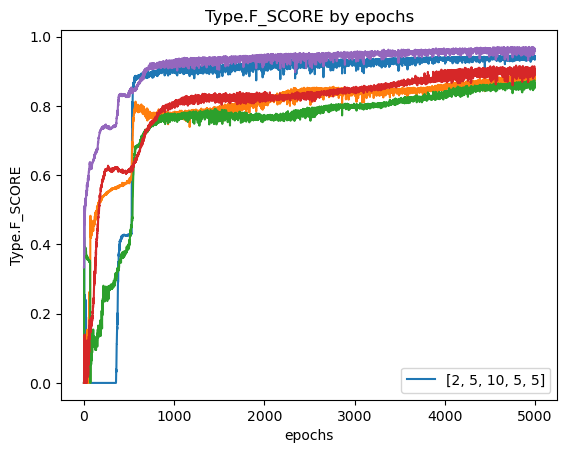

In [80]:
models = compare_layers(
    p_configs_layers=[[2, 5, 10, 5, 5]],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=rings5_X_train,
    p_y=encode_one_hot(rings5_y_train),
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

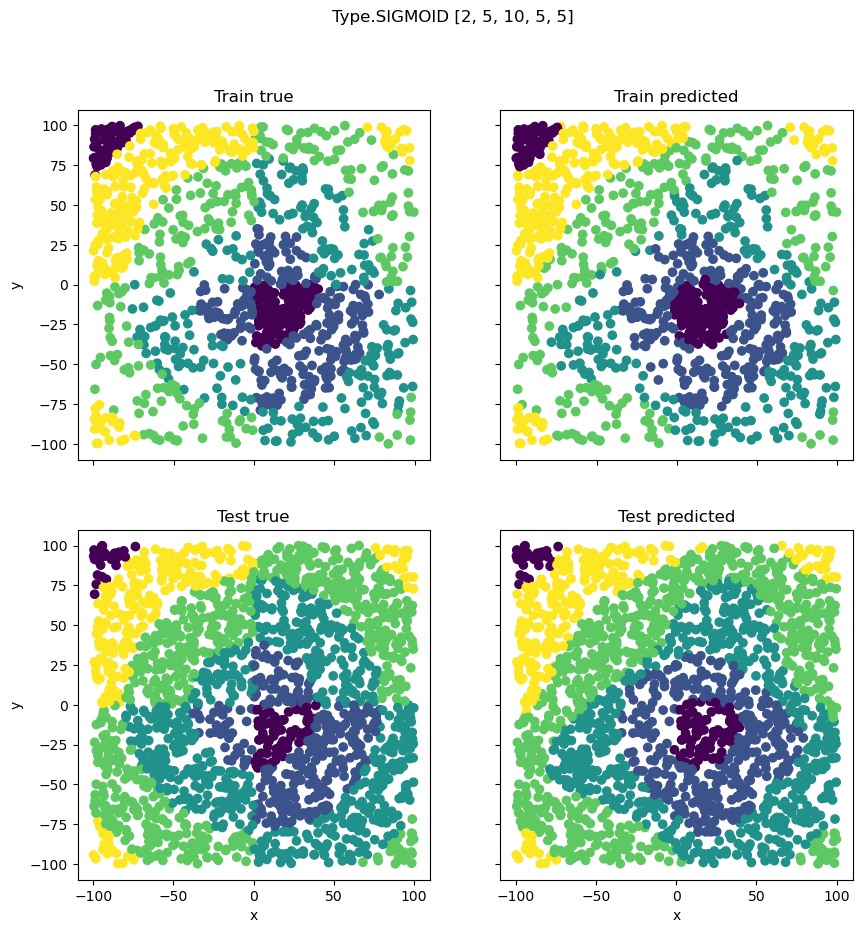

Type.SIGMOID [2, 5, 10, 5, 5]'s metric (Type.F_SCORE) on test: [0.87336245 0.80235988 0.81291391 0.89097473 0.928     ]


In [81]:
present(f'{Activation.Type.SIGMOID} [2, 5, 10, 5, 5]', models[0], Metric.Type.F_SCORE, rings5_X_train, rings5_y_train, rings5_X_test, rings5_y_test)

## 6.3. rings3-regular

### 6.3.1. tanh [2, 5, 5, 3]

[2, 5, 5, 3] evaluated in 0h 0m 42s
[2, 5, 5, 3] last metric: [0.94271357 0.91967871 0.90782953]


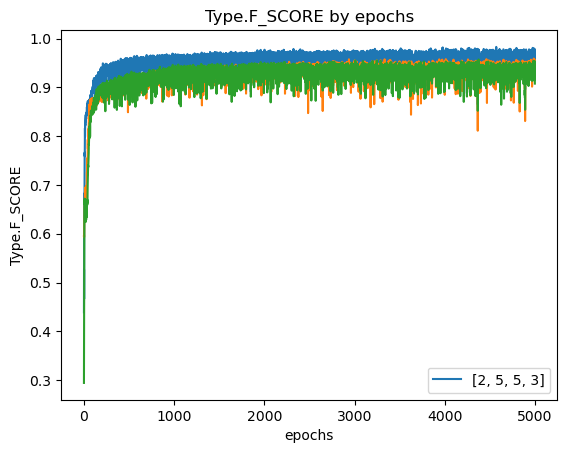

In [82]:
models = compare_layers(
    p_configs_layers=[[2, 5, 5, 3]],
    p_act_t=Activation.Type.TANH,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=rings3_X_train,
    p_y=encode_one_hot(rings3_y_train),
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

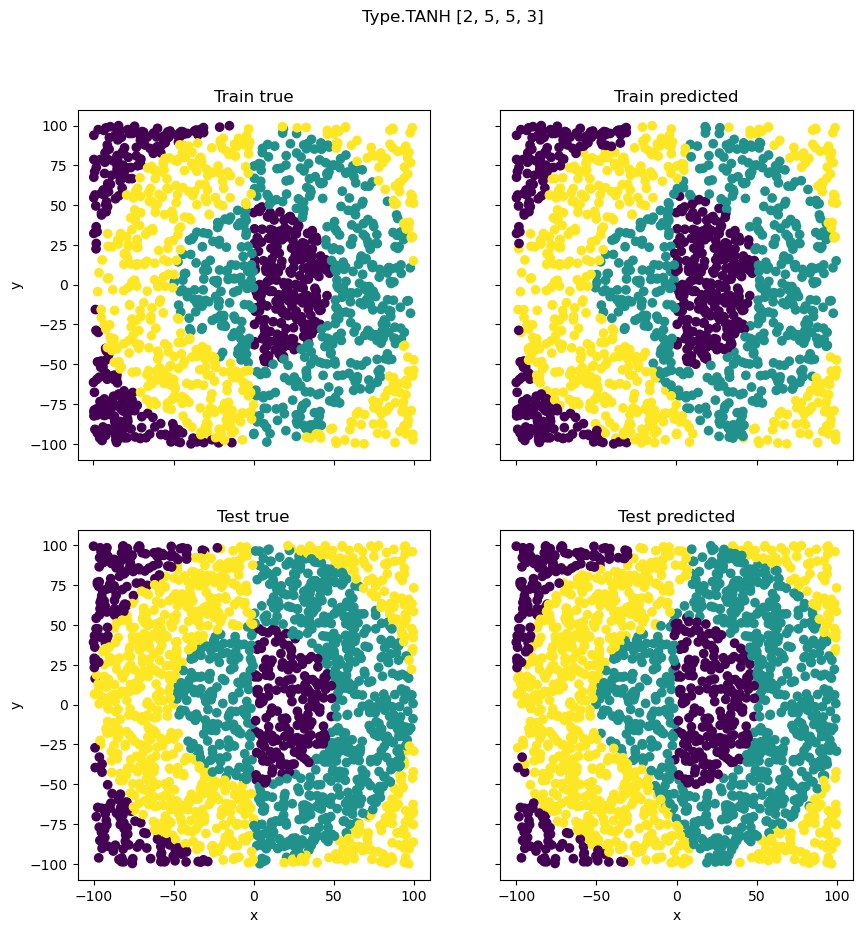

Type.TANH [2, 5, 5, 3]'s metric (Type.F_SCORE) on test: [0.91084337 0.91645244 0.90830235]


In [83]:
present(f'{Activation.Type.TANH} [2, 5, 5, 3]', models[0], Metric.Type.F_SCORE, rings3_X_train, rings3_y_train, rings3_X_test, rings3_y_test)

### 6.3.2. sigmoid [2, 5, 10, 5, 3]

[2, 5, 10, 5, 3] evaluated in 0h 0m 54s
[2, 5, 10, 5, 3] last metric: [0.97688442 0.95695696 0.97017893]


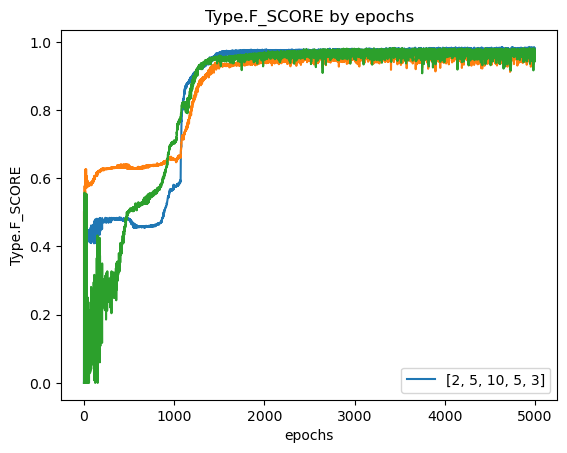

In [84]:
models = compare_layers(
    p_configs_layers=[[2, 5, 10, 5, 3]],
    p_act_t=Activation.Type.SIGMOID,
    p_out_act_t=Activation.Type.SOFTMAX,
    p_weights_t=Weights.Type.HE,
    p_x=rings3_X_train,
    p_y=encode_one_hot(rings3_y_train),
    p_epochs=5000,
    p_mb_size=100,
    p_lr=0.01,
    p_shuffle=True,
    p_normal=False,
    p_cost_t=Cost.Type.CROSS_ENTROPY,
    p_metric_t=Metric.Type.F_SCORE,
    p_method_t=Method.Type.MOMENTUM,
    p_beta=0.9
)

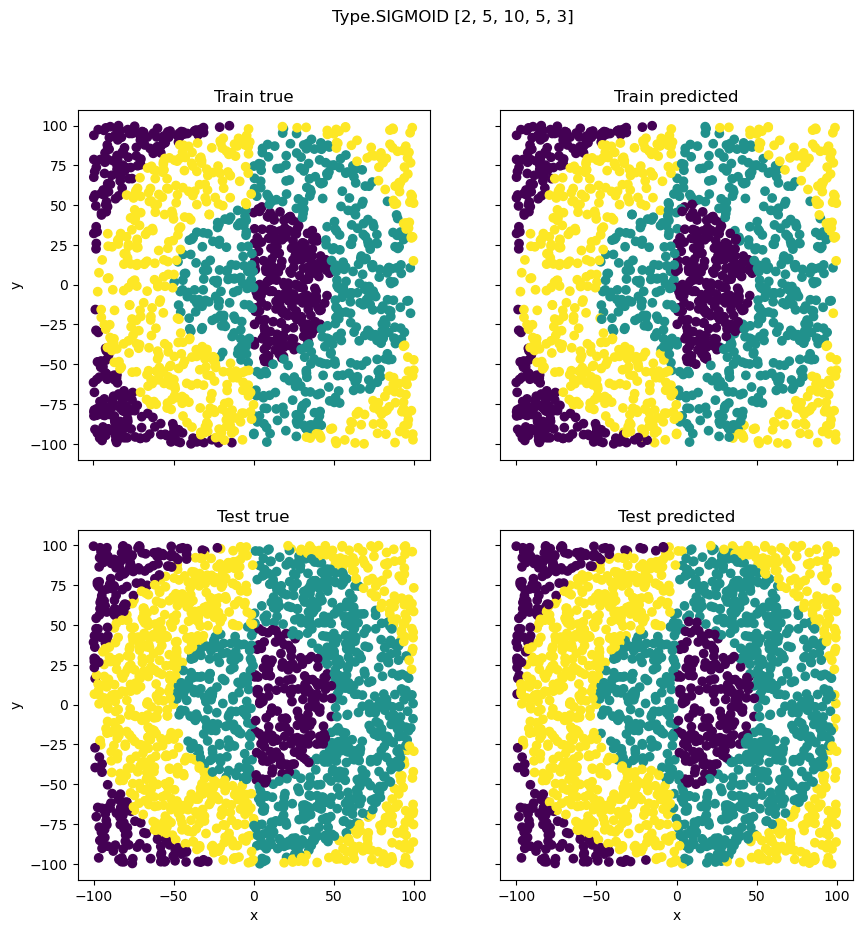

Type.SIGMOID [2, 5, 10, 5, 3]'s metric (Type.F_SCORE) on test: [0.95747266 0.95646524 0.95848596]


In [85]:
present(f'{Activation.Type.SIGMOID} [2, 5, 10, 5, 3]', models[0], Metric.Type.F_SCORE, rings3_X_train, rings3_y_train, rings3_X_test, rings3_y_test)